<a href="https://colab.research.google.com/github/Muftee-Mysan/EN3150---Pattern-Recognition/blob/main/PR_Homework01_220399B_Muftee.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EN3150 Homework 01 Data Pre-processing
## Task: Comparing of different data normalization methods

### Loading the wine dataset from sklearn and visualizing statistics.

**Step 01**


*   Load the Data Set.
*   Data Sets in sklearn are usually in the form of a 'Bunch' object. So to use Pandas, we have to convert the dataset to 'DataFrame' objects.
*   Assign a variable for the data and target
*   Add the target into the DataFrame as well.





In [77]:
from sklearn.datasets import load_wine
import pandas as pd
dataset = load_wine()

# Have to convert to a pandas DataFrame
df = pd.DataFrame(dataset.data, columns=dataset.feature_names)

x, y = dataset.data, dataset.target
feature_names = dataset.feature_names
df['target'] = dataset.target



**Step 2**


*   Next we can check the keys in the dataset
*   'DESCR' gives information about the dataset.






In [78]:
print(dataset.keys())

print(dataset.DESCR)

print("Feature Names: ")
print(dataset.feature_names)

print("Target Names:")
print(dataset.target_names)



dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names'])
.. _wine_dataset:

Wine recognition dataset
------------------------

**Data Set Characteristics:**

:Number of Instances: 178
:Number of Attributes: 13 numeric, predictive attributes and the class
:Attribute Information:
    - Alcohol
    - Malic acid
    - Ash
    - Alcalinity of ash
    - Magnesium
    - Total phenols
    - Flavanoids
    - Nonflavanoid phenols
    - Proanthocyanins
    - Color intensity
    - Hue
    - OD280/OD315 of diluted wines
    - Proline
    - class:
        - class_0
        - class_1
        - class_2

:Summary Statistics:

============================= ==== ===== ======= =====
                                Min   Max   Mean     SD
============================= ==== ===== ======= =====
Alcohol:                      11.0  14.8    13.0   0.8
Malic Acid:                   0.74  5.80    2.34  1.12
Ash:                          1.36  3.23    2.36  0.27
Alcalinity of Ash:          



*   We can also use the below two operations to describe the data.




In [79]:
df.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,0


In [80]:
df.describe()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258,0.938202
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474,0.775035
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000,0.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000,0.000000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000,1.000000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000,2.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000,2.000000


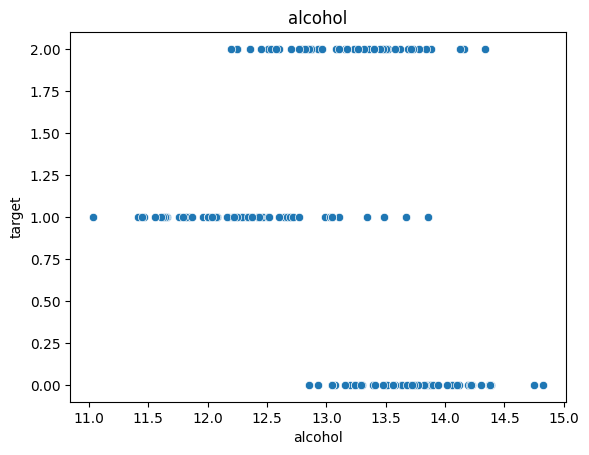

<Figure size 1000x600 with 0 Axes>

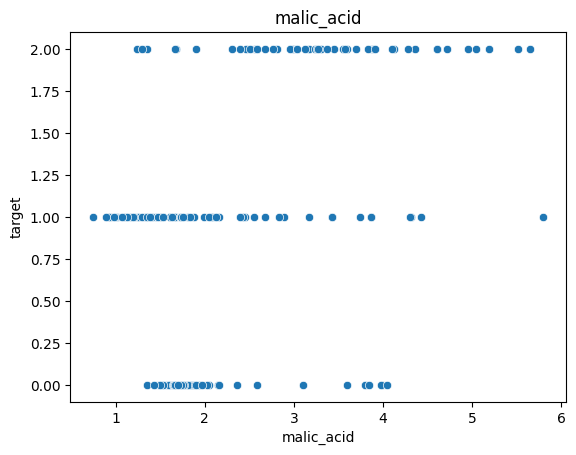

<Figure size 1000x600 with 0 Axes>

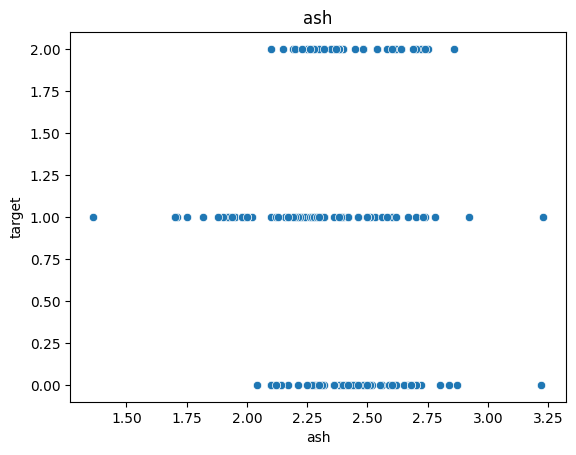

<Figure size 1000x600 with 0 Axes>

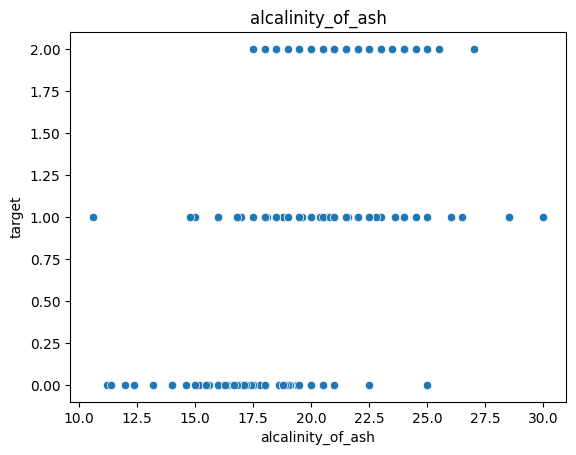

<Figure size 1000x600 with 0 Axes>

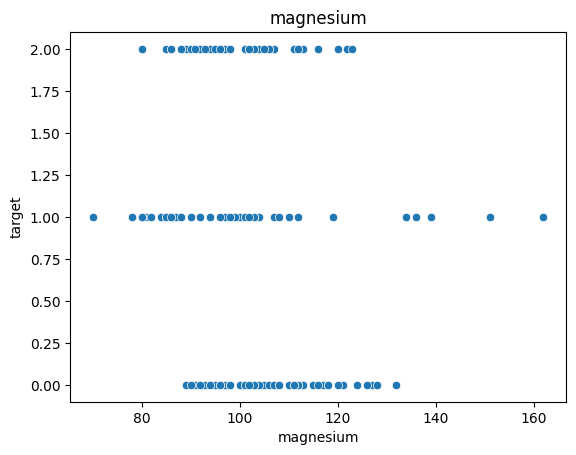

<Figure size 1000x600 with 0 Axes>

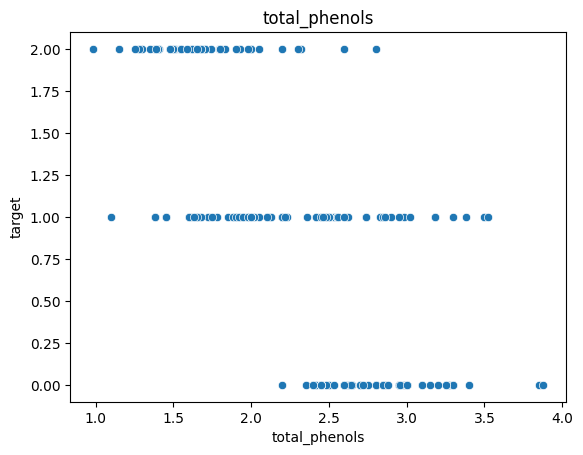

<Figure size 1000x600 with 0 Axes>

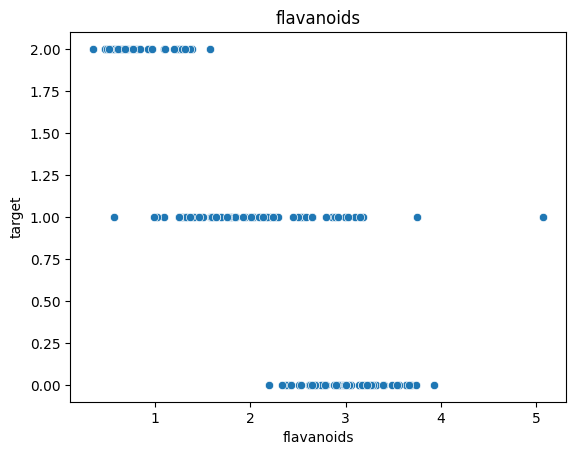

<Figure size 1000x600 with 0 Axes>

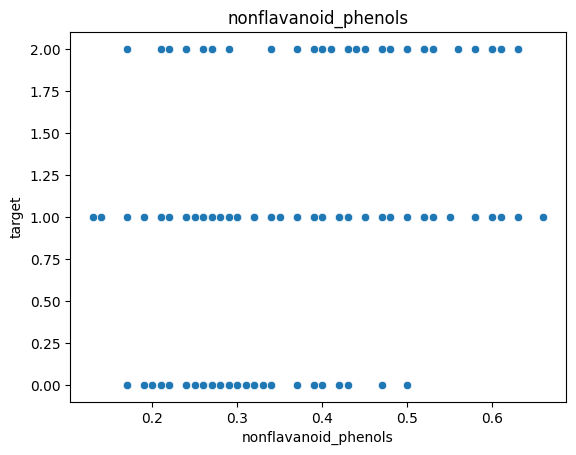

<Figure size 1000x600 with 0 Axes>

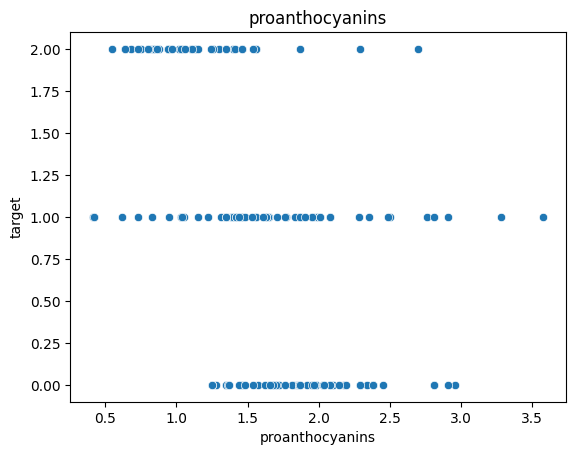

<Figure size 1000x600 with 0 Axes>

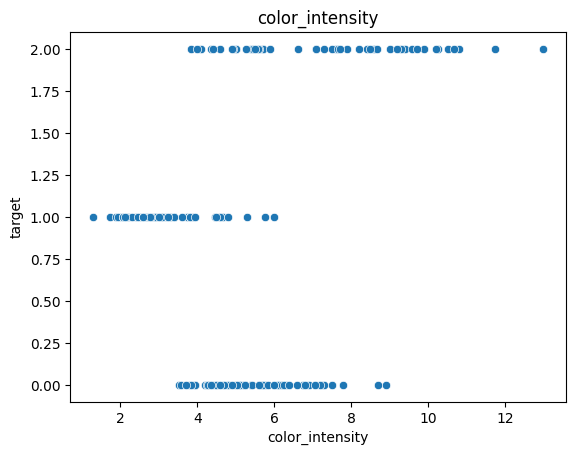

<Figure size 1000x600 with 0 Axes>

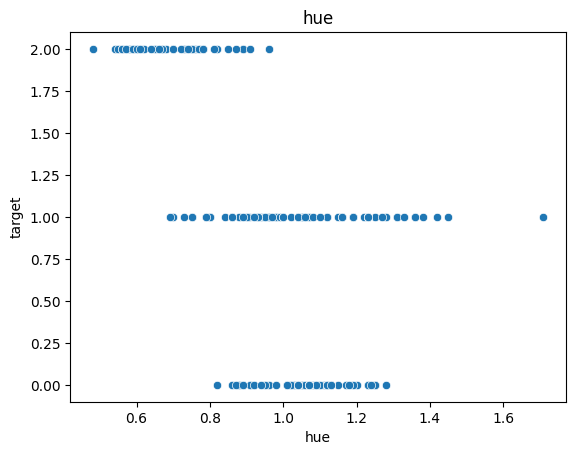

<Figure size 1000x600 with 0 Axes>

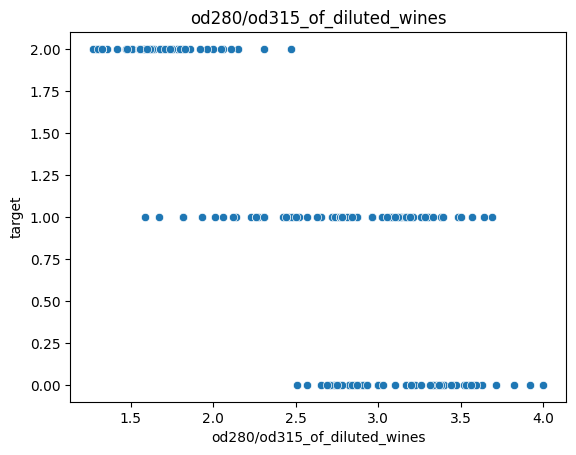

<Figure size 1000x600 with 0 Axes>

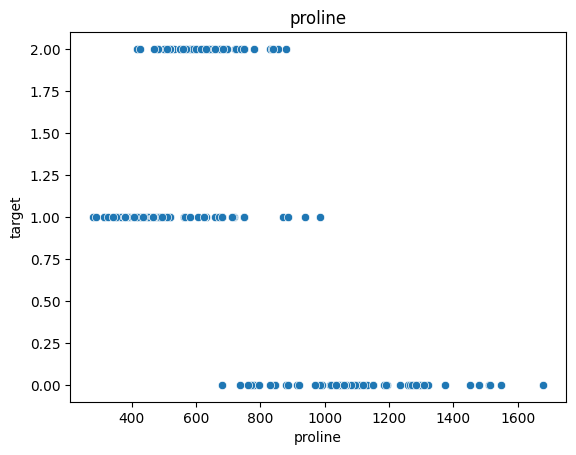

<Figure size 1000x600 with 0 Axes>

In [81]:
#scatter plots of each feature vs target
import matplotlib.pyplot as plt
import seaborn as sns
for feature in feature_names:
  sns.scatterplot(x=feature, y='target', data=df)
  plt.title(feature)
  plt.figure(figsize=(10, 6))
  plt.show()

**Step 03**


*   It's good practice to check the target data distribution




In [82]:
df['target'].value_counts()


,count
target,
1,71
0,59
2,48


<Axes: title={'center': 'Wine Class Distribution'}, xlabel='target'>

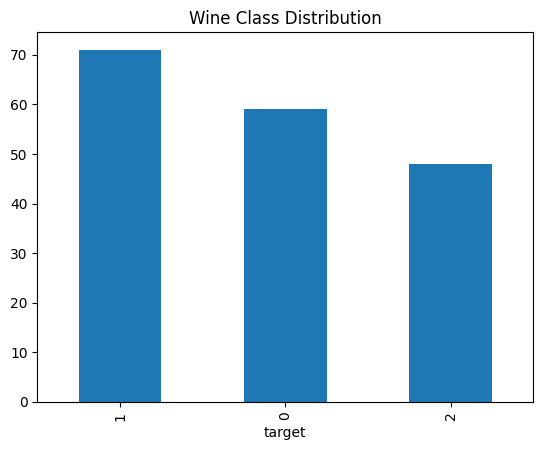

In [83]:
#Alternatively,
df['target'].value_counts().plot(kind = 'bar', title = 'Wine Class Distribution')

<Axes: title={'center': 'Wine Class Distribution'}, ylabel='count'>

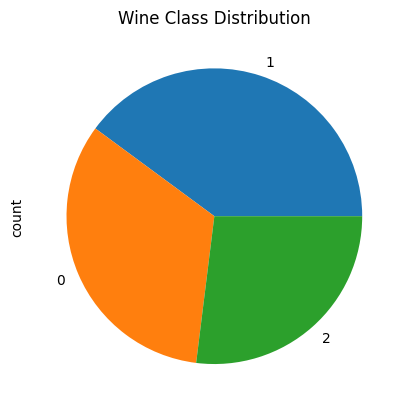

In [84]:
#Alternatively,
df['target'].value_counts().plot(kind = 'pie', title = 'Wine Class Distribution')

**Step 04**


*   We have to study the features using different plots.
*   Exploratory Data Analysis



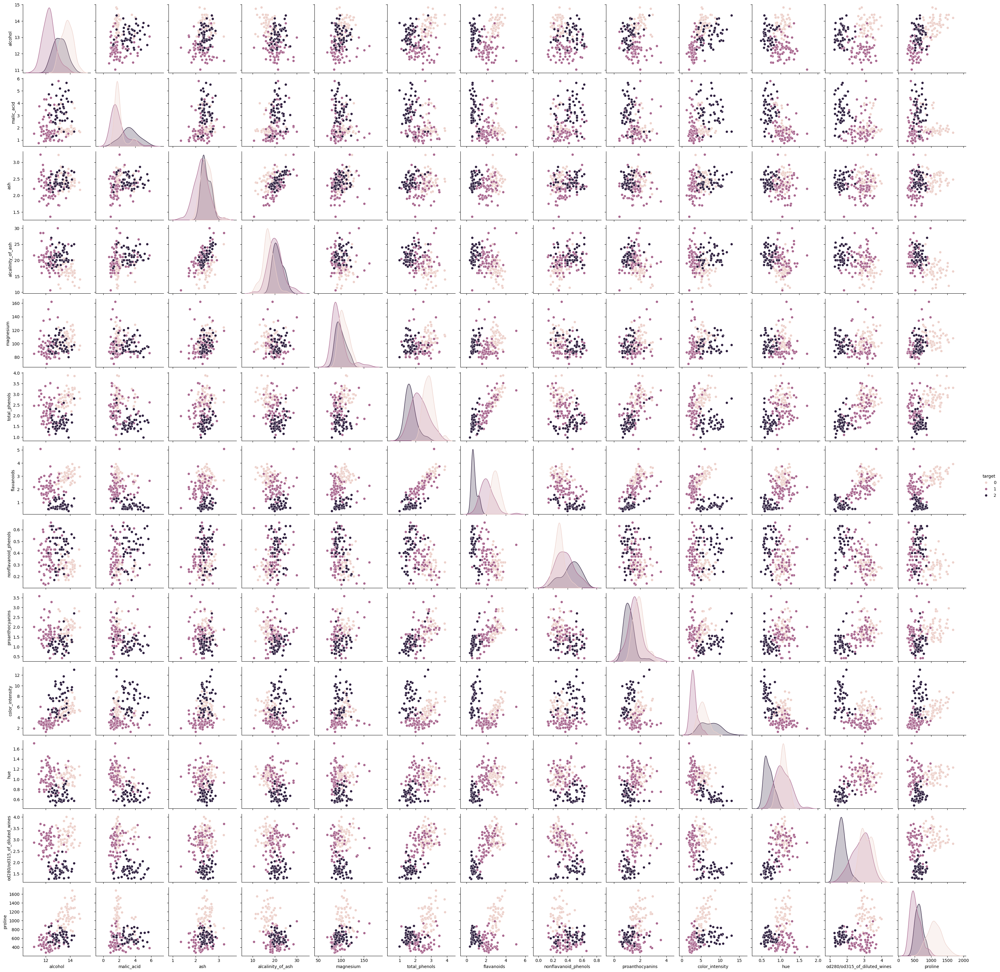

In [85]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(df, hue='target')
plt.show()

**Pairplot**


*   Relationship between variables (how one correlates with the other)
*   Clustering and class seperation
*   Identify Redundant Features and remove them for dimensionality reduction.
*   Look for Outliers
*   Feature distribution.








**Solutions to fix a crowded pairplot**


*   select a subset of features
*   Use 'corner = True' to plot only the lower triangle
*   Use dimensionality reduction before plotting






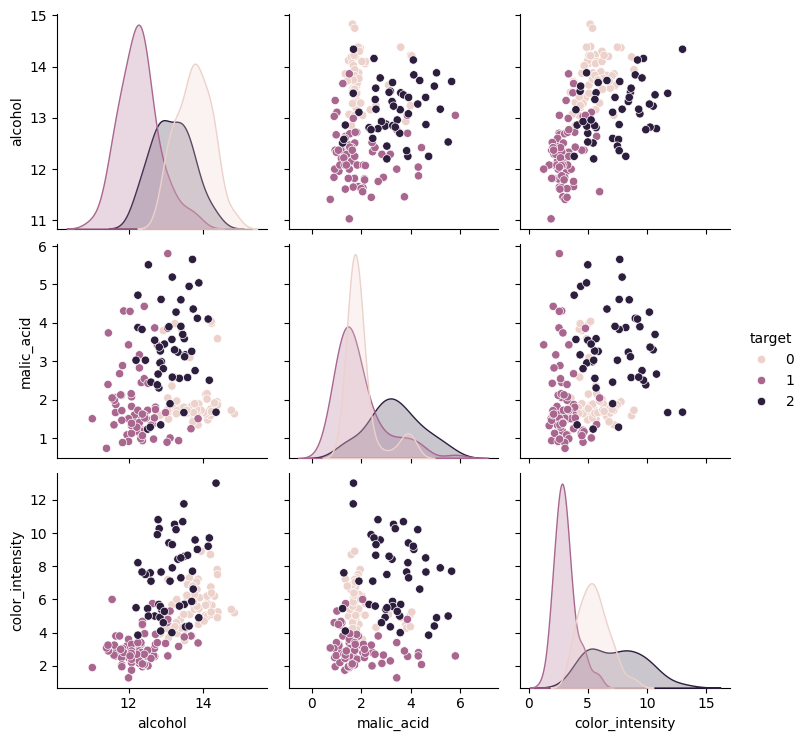

In [86]:
selected = ['alcohol', 'malic_acid', 'color_intensity', 'target']
sns.pairplot(df[selected], hue='target')
plt.show()

🔍 Diagonal Plots — Feature Distributions per Class

These are KDE plots (smooth histograms) for each individual feature, separated by class.

**Alcohol:**
*   Class 0 (yellow): Mostly higher alcohol content.
*   Class 1 (pink): Middle-range alcohol content.
*   Class 2 (grey): Mostly lower alcohol content.

→ 🧠 Alcohol is a strong differentiator between classes.

**Malic Acid:**
*   Class 0: Low malic acid (peaks around 1).
*   Class 1: High malic acid (peaks around 3).
*  Class 2: Intermediate values.

→ 🧠 This feature also helps separate the classes, but with more overlap.

**Color Intensity:**
*   Class 2: Clearly higher values.
*   Class 0 & 1: Lower values with some overlap.

→ 🧠 Good for identifying Class 2.


🔄 Off-Diagonal Plots — Pairwise Scatterplots

These show how the features interact in combination and how the classes are distributed in 2D space.

**Alcohol vs Malic Acid:**
*   Class 0: High alcohol + low malic acid (bottom right).
*   Class 1: Mid alcohol + high malic acid (top middle).
*   Class 2: Lower alcohol, scattered malic acid.

→ ✅ Useful for separating all three classes visually.

**Alcohol vs Color Intensity:**
*   Class 2: Low alcohol, high color intensity (top left).
*   Class 0: High alcohol, mid color intensity (bottom right).
*   Class 1: Overlaps with both.

→ 🧠 This pair is great for distinguishing Class 2.

**Malic Acid vs Color Intensity:**

*   Class 2: Spreads wide on both axes.
*   Class 0: Clustered at low malic acid, low color intensity.
*   Class 1: Clustered at high malic acid, low-mid color intensity.

→ 🧠 Some overlap, but trends still visible.

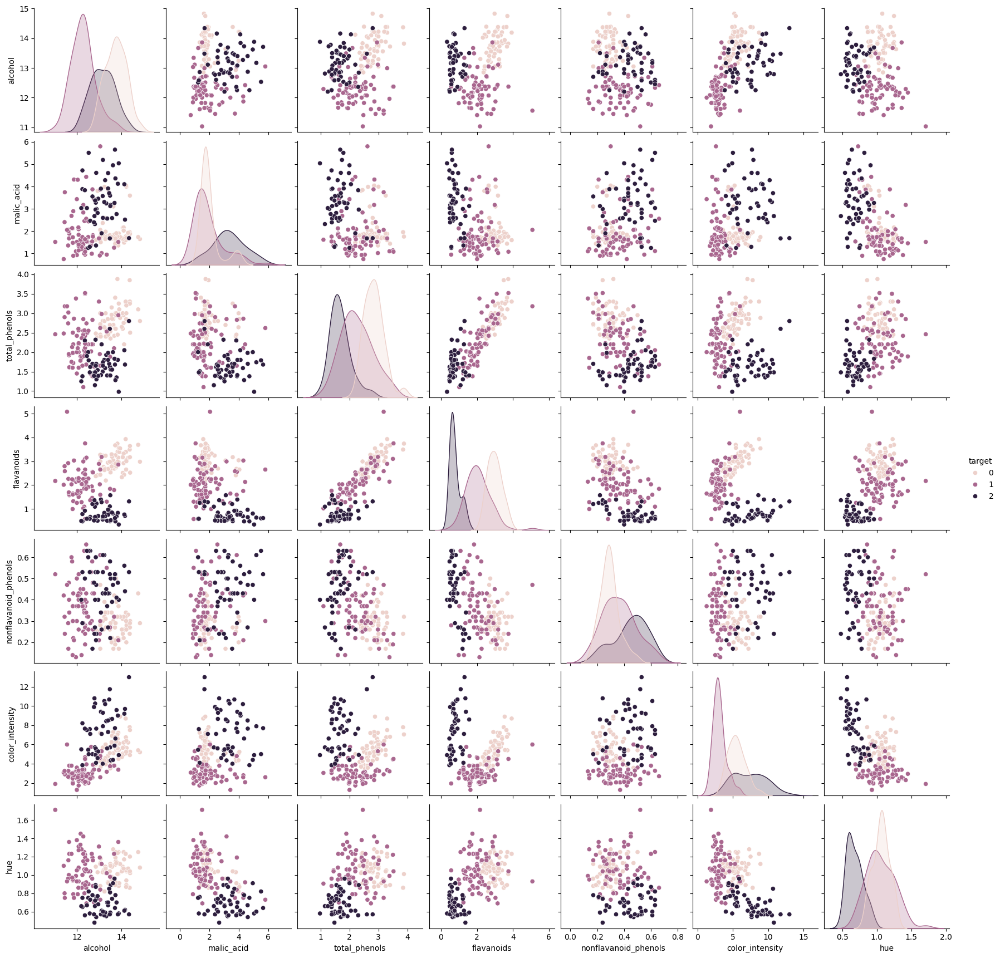

In [87]:
# From the diagonal plot, the below features seems to have an effect.
# X = feature values
# Y = Estimated Density
effective_features = ['alcohol', 'malic_acid', 'total_phenols', 'flavanoids', 'nonflavanoid_phenols', 'color_intensity', 'hue', 'target']
sns.pairplot(df[effective_features], hue='target')
plt.show()

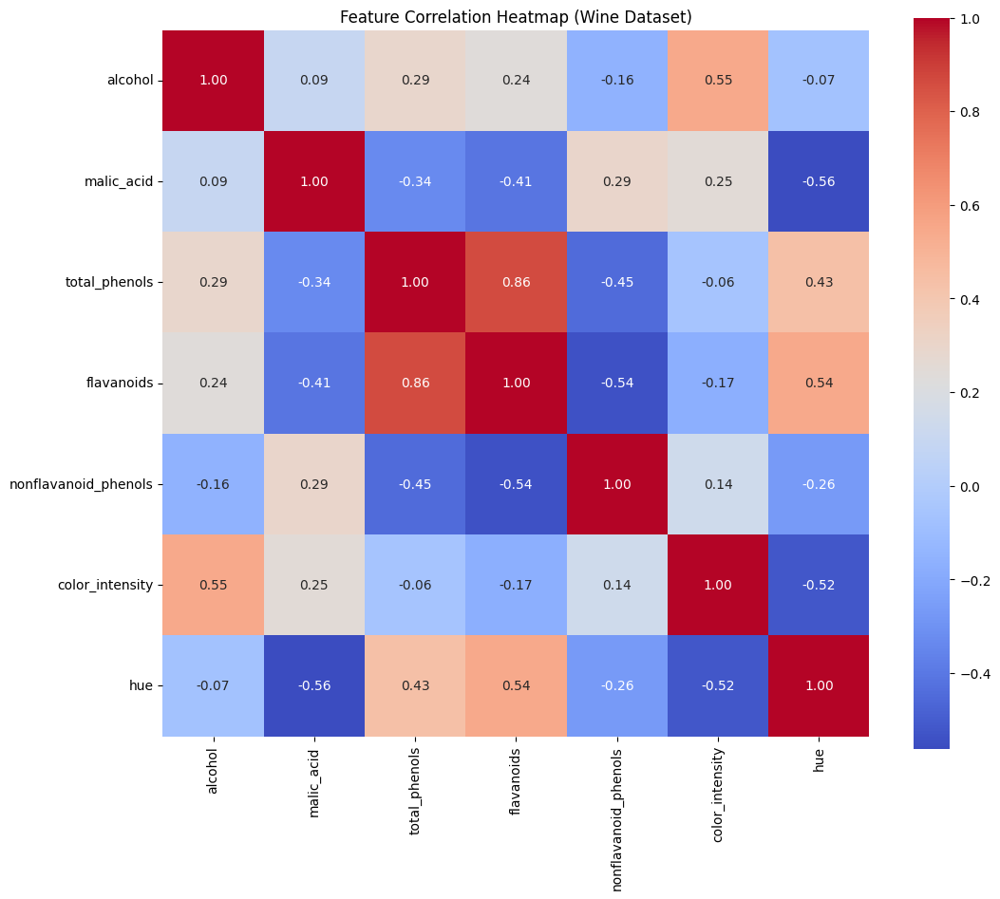

In [88]:
# Drop target column for correlation matrix
corr_matrix = df[effective_features].drop(columns=['target']).corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title("Feature Correlation Heatmap (Wine Dataset)")
plt.show()

🧠 **Intuition from the heatmap**

*   Find highly correlated pairs (correlation > 0.8 or < -0.8): These might be redundant features.
*   Identify uncorrelated features: Useful for classifiers that assume feature independence (like Naive Bayes).
*   Spot clusters of similar features, which may help in dimensionality reduction (e.g., PCA).




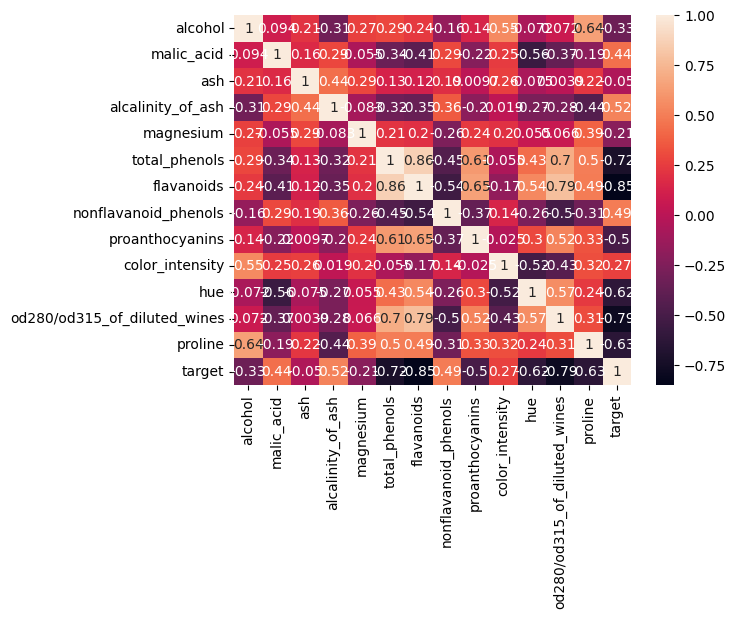

<Figure size 2000x2000 with 0 Axes>

In [89]:
sns.heatmap(df.corr(), annot=True)
plt.figure(figsize=(20, 20))
plt.show()

📦 What a Boxplot Shows

Each boxplot represents the distribution of one feature (e.g., alcohol, malic acid) across different classes (your target classes: wine types 0, 1, 2). It visualizes:



*   Median (Q2): The line inside the box (middle value).
*   Interquartile Range (IQR): The box spans from Q1 (25th percentile) to Q3 (75th percentile).
*   Whiskers: Extend to min/max values within 1.5×IQR from Q1/Q3.
*   Outliers: Points outside whiskers (potentially useful for anomaly detection).













✅ Intuition You Can Gain from Boxplots (in classification)
1. Feature Discrimination Power

*   You want to find features that separate classes well.
*   If the boxes don’t overlap much between classes, the feature is a good candidate for classification.
*   If all boxes for a feature are similar in position and spread, it’s less useful.

Example:

If alcohol for class 0 is mostly in 12–13%, but for class 2 it’s 13–14.5%, it's a good discriminator.

2. Skewness and Outliers

*   Skewed distributions may suggest non-linear boundaries or need for transformation.
*   Many outliers could suggest noisy data or classes with higher variability.

3. Class Variance

*   Wide boxes = high variance.
*   If one class has a narrow range while others are more spread out, that affects model behavior.






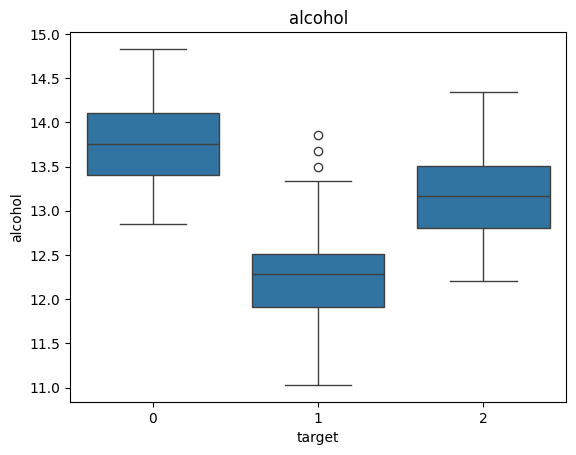

<Figure size 1000x600 with 0 Axes>

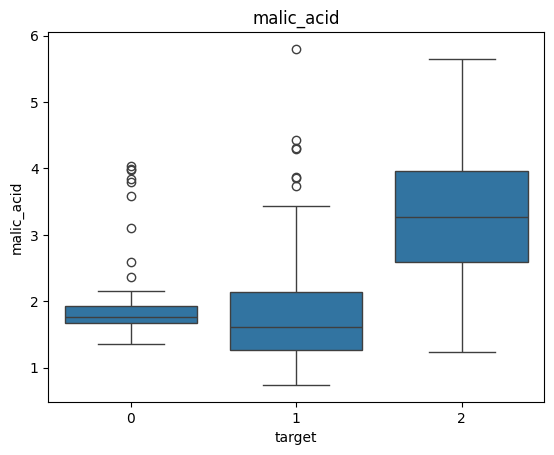

<Figure size 1000x600 with 0 Axes>

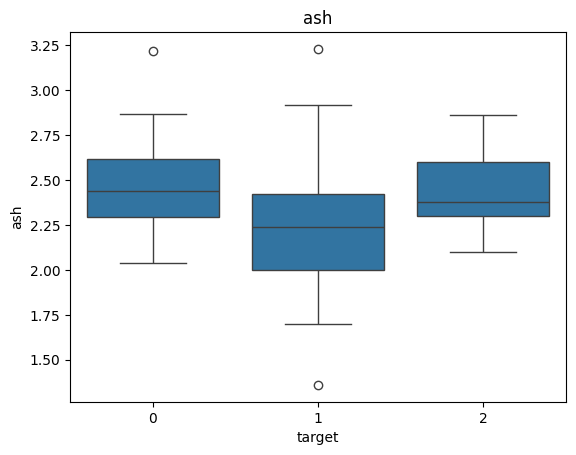

<Figure size 1000x600 with 0 Axes>

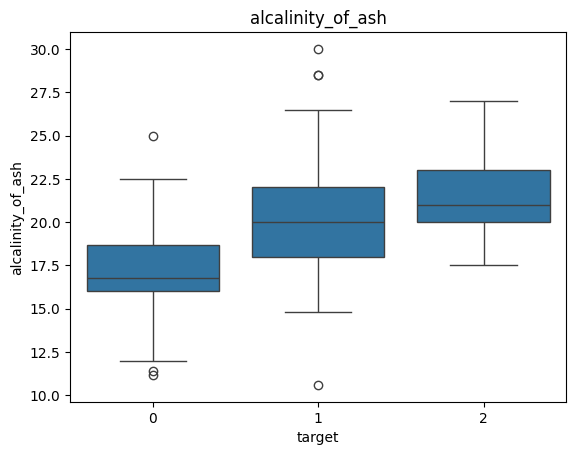

<Figure size 1000x600 with 0 Axes>

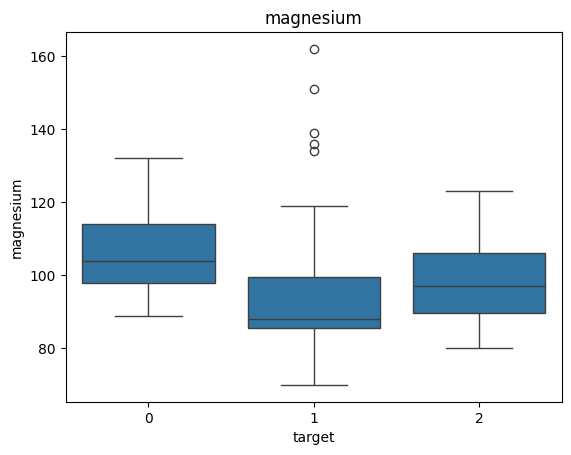

<Figure size 1000x600 with 0 Axes>

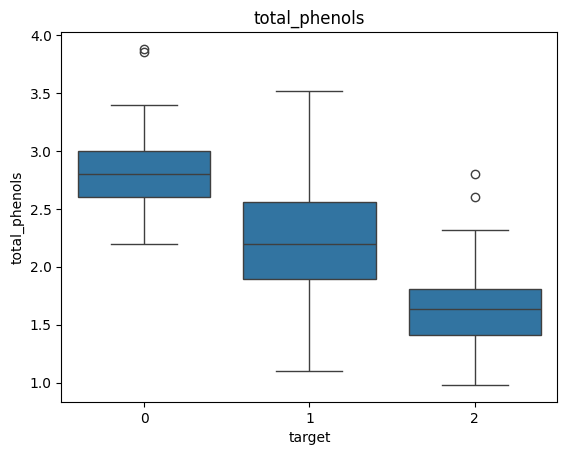

<Figure size 1000x600 with 0 Axes>

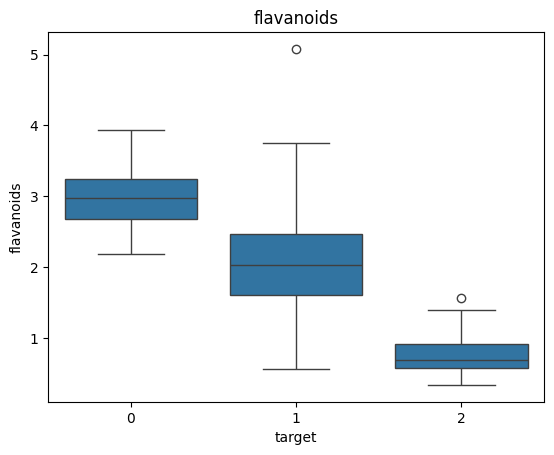

<Figure size 1000x600 with 0 Axes>

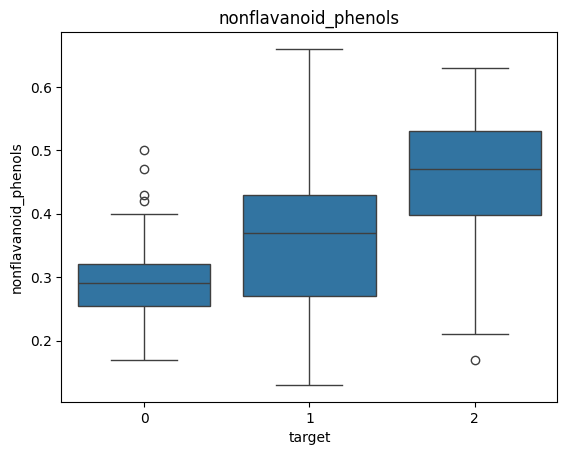

<Figure size 1000x600 with 0 Axes>

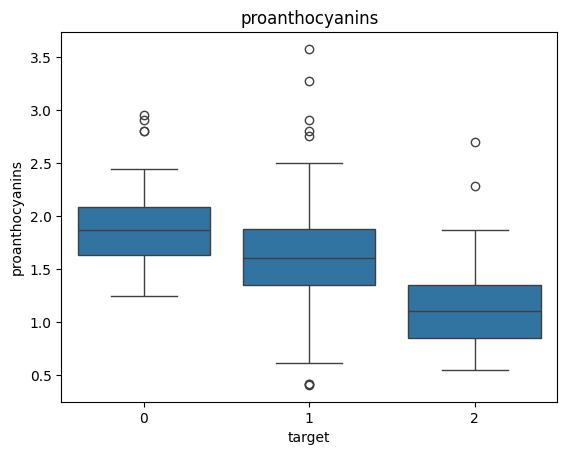

<Figure size 1000x600 with 0 Axes>

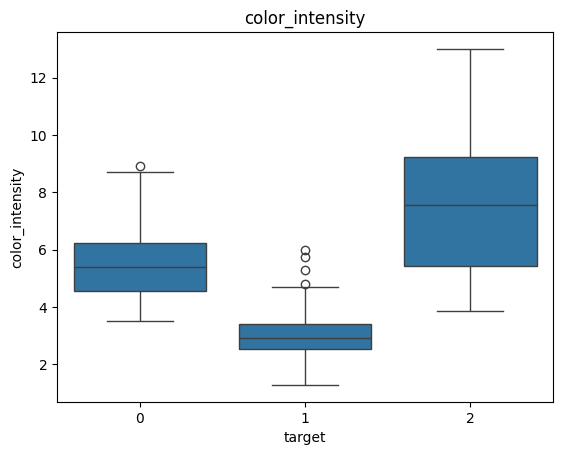

<Figure size 1000x600 with 0 Axes>

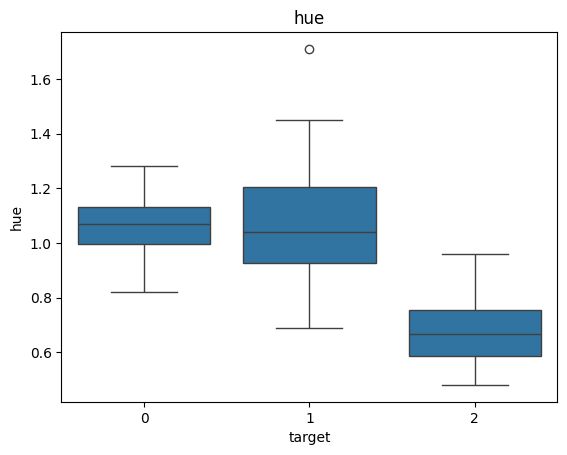

<Figure size 1000x600 with 0 Axes>

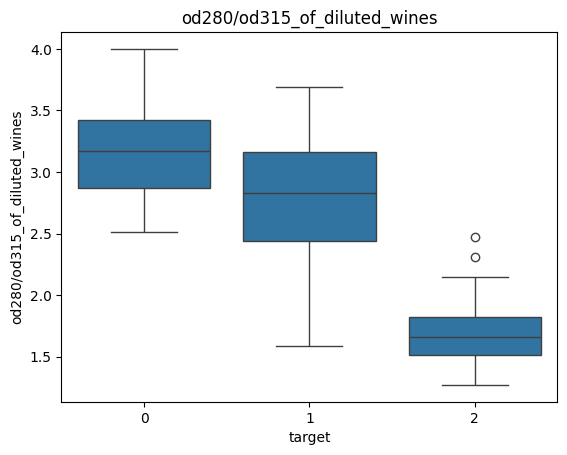

<Figure size 1000x600 with 0 Axes>

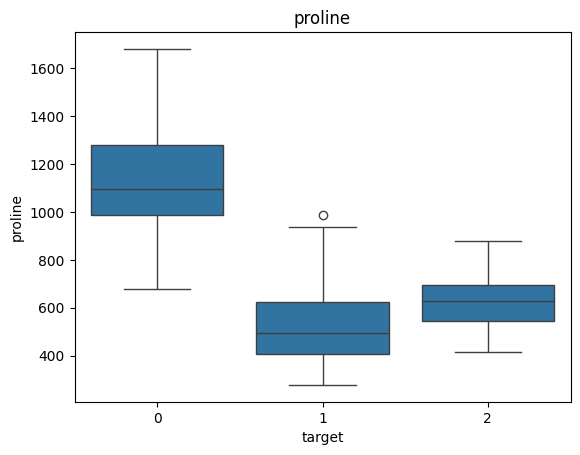

<Figure size 1000x600 with 0 Axes>

In [90]:
for feature in feature_names:
  sns.boxplot(x='target', y=feature, data=df)
  plt.title(feature)
  plt.figure(figsize=(10, 6))
  plt.show()

Let's select two features with outliers.
*   Malic Acid
*   Proanthocyanins



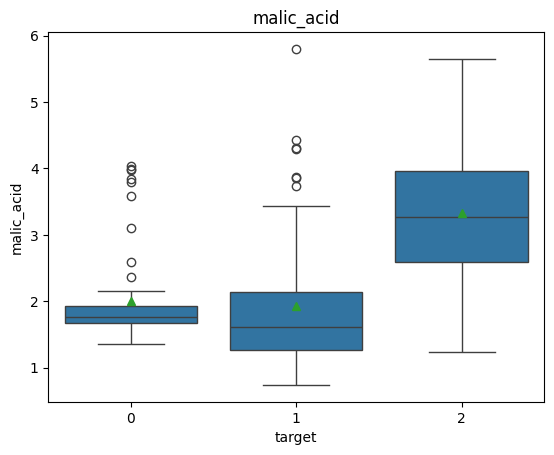

<Figure size 1000x600 with 0 Axes>

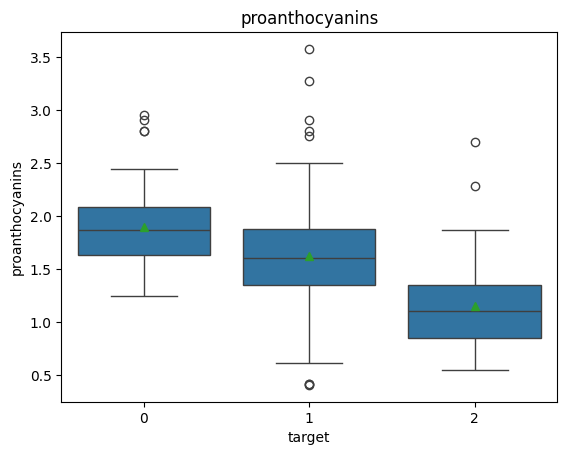

<Figure size 1000x600 with 0 Axes>

In [91]:
outlier_features = ['malic_acid', 'proanthocyanins']
for feature in outlier_features:
  sns.boxplot(x='target', y=feature, data=df, showmeans=True)
  plt.title(feature)
  plt.figure(figsize=(10, 6))
  plt.show()

**Step 05**

*   Visualize data distribution to check whether it's Gaussian




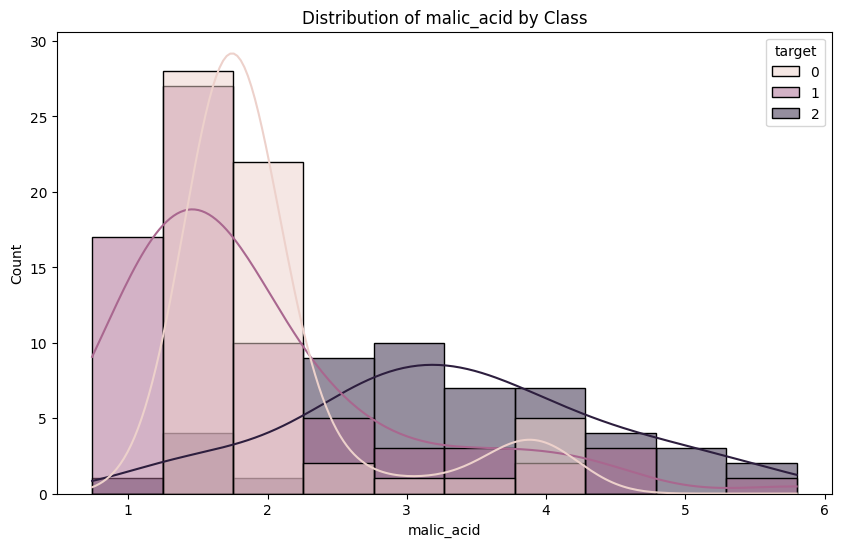

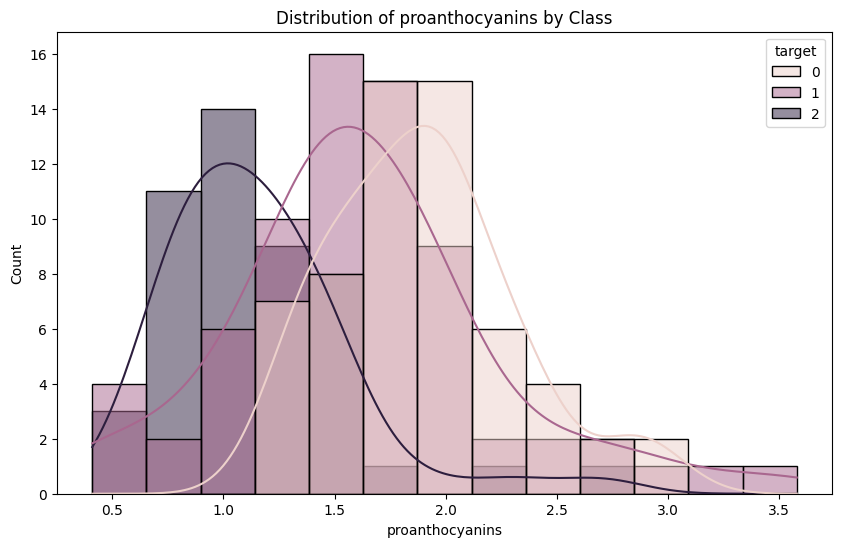

In [92]:
for col in df[outlier_features]:
  plt.figure(figsize=(10, 6))
  sns.histplot(data=df, x=col, hue='target', kde=True)
  plt.title(f'Distribution of {col} by Class')
  plt.show()

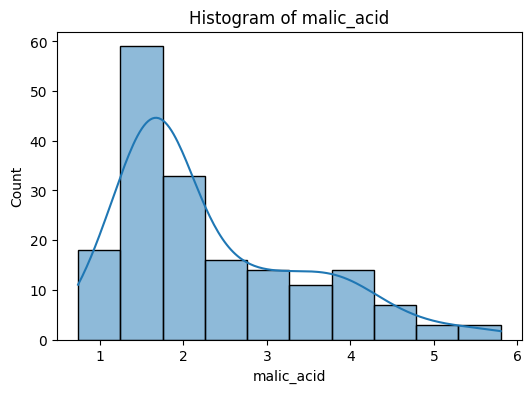

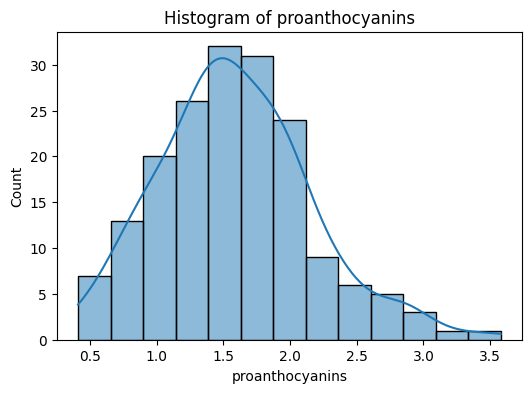

In [93]:
for col in df[outlier_features]:  # Exclude 'target'
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Histogram of {col}")
    plt.show()

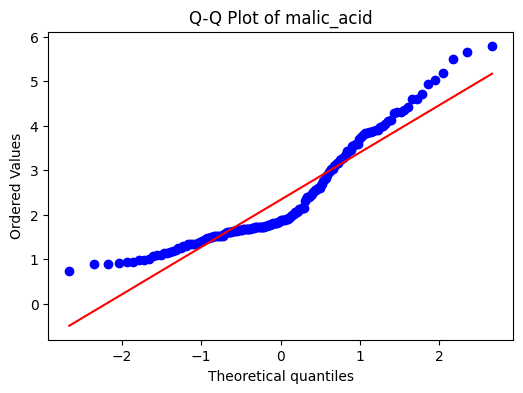

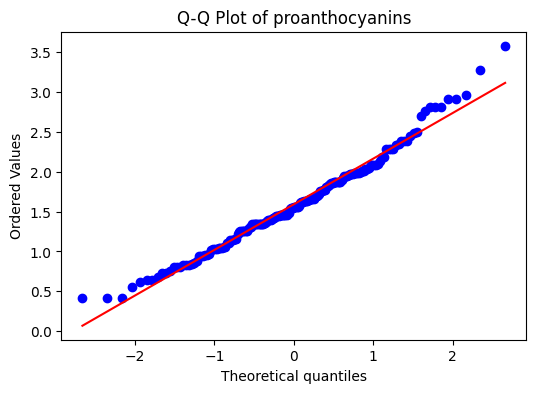

In [94]:
import scipy.stats as stats
for col in df[outlier_features]:
    plt.figure(figsize=(6, 4))
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.title(f"Q-Q Plot of {col}")
    plt.show()

🔍 What Is a Q-Q Plot?

*   The Q-Q plot compares the quantiles of your sample data to the quantiles of a theoretical distribution.
*   If your data closely follows the theoretical distribution (e.g., normal), the points in the Q-Q plot will approximately lie on a straight diagonal line.



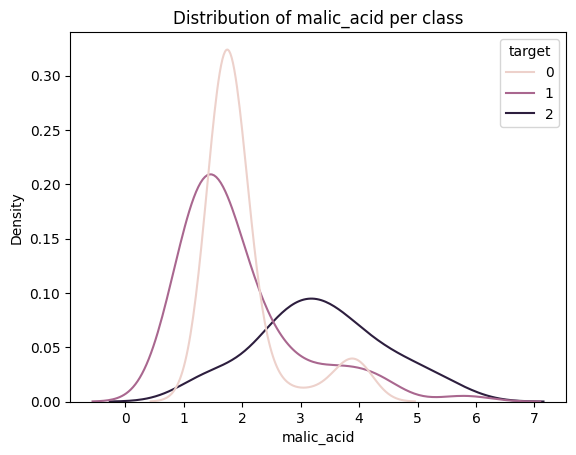

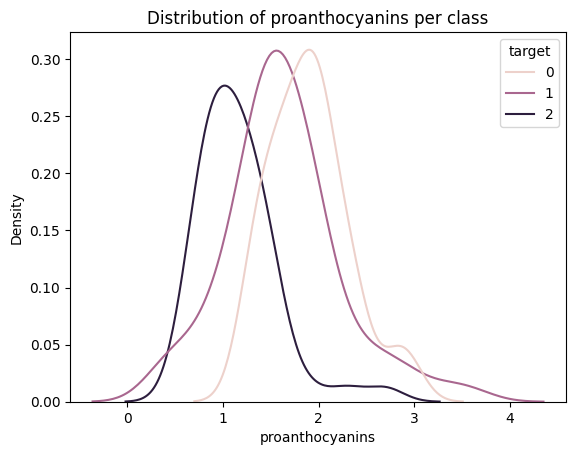

In [95]:
for col in df[outlier_features]:  # assuming last col is 'target'
    sns.kdeplot(data=df, x=col, hue='target')
    plt.title(f'Distribution of {col} per class')
    plt.show()

**Step 06**
Let's Normalize Data

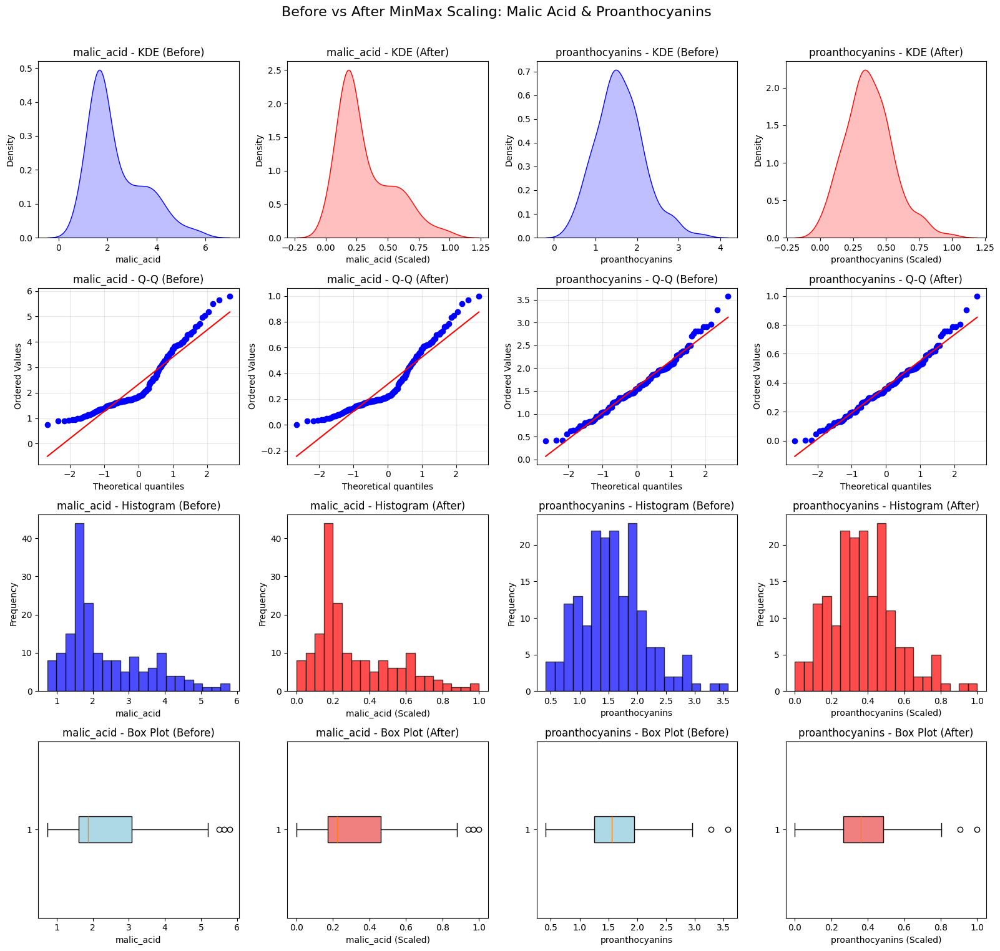

'\n# Individual plots for each feature\nfor i, feature in enumerate(outlier_features):\n    original = df[feature]\n    scaled = MinMaxScaled[:, i]\n\n    fig, axes = plt.subplots(4, 2, figsize=(12, 16))\n    fig.suptitle(f"\'{feature}\' - Before vs After MinMax Scaling", fontsize=16)\n\n    # 1. KDE Plot\n    sns.kdeplot(original, ax=axes[0, 0], fill=True, color=\'blue\')\n    axes[0, 0].set_title(\'KDE Plot - Before Scaling\')\n    axes[0, 0].set_xlabel(feature)\n\n    sns.kdeplot(scaled, ax=axes[0, 1], fill=True, color=\'red\')\n    axes[0, 1].set_title(\'KDE Plot - After Scaling\')\n    axes[0, 1].set_xlabel(f\'{feature} (Scaled)\')\n\n    # 2. Q-Q Plot\n    stats.probplot(original.dropna(), dist="norm", plot=axes[1, 0])\n    axes[1, 0].set_title(\'Q-Q Plot - Before Scaling\')\n    axes[1, 0].grid(True, alpha=0.3)\n\n    stats.probplot(scaled, dist="norm", plot=axes[1, 1])\n    axes[1, 1].set_title(\'Q-Q Plot - After Scaling\')\n    axes[1, 1].grid(True, alpha=0.3)\n\n    # 3. Hist

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Define your outlier features
outlier_features = ['malic_acid', 'proanthocyanins']

# Apply MinMax scaling
scaler = MinMaxScaler()
MinMaxScaled = scaler.fit_transform(df[outlier_features])

# Calculate number of features and create appropriate subplot grid
n_features = len(outlier_features)

# Create a single figure with subplots for all features (4 rows x 4 columns for 2 features)
fig, axes = plt.subplots(4, 4, figsize=(16, 16))
fig.suptitle("Before vs After MinMax Scaling: Malic Acid & Proanthocyanins", fontsize=16)

# If only one feature, ensure axes is 2D
if n_features == 1:
    axes = axes.reshape(4, 2)

# Loop over each feature
for i, feature in enumerate(outlier_features):
    original = df[feature]
    scaled = MinMaxScaled[:, i]

    # Calculate column indices for before and after
    col_before = i * 2
    col_after = i * 2 + 1

    # 1. KDE Plot
    sns.kdeplot(original, ax=axes[0, col_before], fill=True, color='blue')
    axes[0, col_before].set_title(f'{feature} - KDE (Before)')
    axes[0, col_before].set_xlabel(feature)

    sns.kdeplot(scaled, ax=axes[0, col_after], fill=True, color='red')
    axes[0, col_after].set_title(f'{feature} - KDE (After)')
    axes[0, col_after].set_xlabel(f'{feature} (Scaled)')

    # 2. Q-Q Plot
    stats.probplot(original.dropna(), dist="norm", plot=axes[1, col_before])
    axes[1, col_before].set_title(f'{feature} - Q-Q (Before)')
    axes[1, col_before].grid(True, alpha=0.3)

    stats.probplot(scaled, dist="norm", plot=axes[1, col_after])
    axes[1, col_after].set_title(f'{feature} - Q-Q (After)')
    axes[1, col_after].grid(True, alpha=0.3)

    # 3. Histogram
    axes[2, col_before].hist(original.dropna(), bins=20, alpha=0.7, color='blue', edgecolor='black')
    axes[2, col_before].set_title(f'{feature} - Histogram (Before)')
    axes[2, col_before].set_xlabel(feature)
    axes[2, col_before].set_ylabel('Frequency')

    axes[2, col_after].hist(scaled, bins=20, alpha=0.7, color='red', edgecolor='black')
    axes[2, col_after].set_title(f'{feature} - Histogram (After)')
    axes[2, col_after].set_xlabel(f'{feature} (Scaled)')
    axes[2, col_after].set_ylabel('Frequency')

    # 4. Box Plot
    axes[3, col_before].boxplot(original.dropna(), vert=False, patch_artist=True,
                               boxprops=dict(facecolor='lightblue'))
    axes[3, col_before].set_title(f'{feature} - Box Plot (Before)')
    axes[3, col_before].set_xlabel(feature)

    axes[3, col_after].boxplot(scaled, vert=False, patch_artist=True,
                              boxprops=dict(facecolor='lightcoral'))
    axes[3, col_after].set_title(f'{feature} - Box Plot (After)')
    axes[3, col_after].set_xlabel(f'{feature} (Scaled)')


# Adjust layout and show
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

# Alternative approach: Create separate plots for each feature (if you prefer individual plots)
# Uncomment the code below if you want individual plots for each feature instead

"""
# Individual plots for each feature
for i, feature in enumerate(outlier_features):
    original = df[feature]
    scaled = MinMaxScaled[:, i]

    fig, axes = plt.subplots(4, 2, figsize=(12, 16))
    fig.suptitle(f"'{feature}' - Before vs After MinMax Scaling", fontsize=16)

    # 1. KDE Plot
    sns.kdeplot(original, ax=axes[0, 0], fill=True, color='blue')
    axes[0, 0].set_title('KDE Plot - Before Scaling')
    axes[0, 0].set_xlabel(feature)

    sns.kdeplot(scaled, ax=axes[0, 1], fill=True, color='red')
    axes[0, 1].set_title('KDE Plot - After Scaling')
    axes[0, 1].set_xlabel(f'{feature} (Scaled)')

    # 2. Q-Q Plot
    stats.probplot(original.dropna(), dist="norm", plot=axes[1, 0])
    axes[1, 0].set_title('Q-Q Plot - Before Scaling')
    axes[1, 0].grid(True, alpha=0.3)

    stats.probplot(scaled, dist="norm", plot=axes[1, 1])
    axes[1, 1].set_title('Q-Q Plot - After Scaling')
    axes[1, 1].grid(True, alpha=0.3)

    # 3. Histogram
    axes[2, 0].hist(original.dropna(), bins=20, alpha=0.7, color='blue', edgecolor='black')
    axes[2, 0].set_title('Histogram - Before Scaling')
    axes[2, 0].set_xlabel(feature)
    axes[2, 0].set_ylabel('Frequency')

    axes[2, 1].hist(scaled, bins=20, alpha=0.7, color='red', edgecolor='black')
    axes[2, 1].set_title('Histogram - After Scaling')
    axes[2, 1].set_xlabel(f'{feature} (Scaled)')
    axes[2, 1].set_ylabel('Frequency')

    # 4. Box Plot
    axes[3, 0].boxplot(original.dropna(), vert=False, patch_artist=True,
                       boxprops=dict(facecolor='lightblue'))
    axes[3, 0].set_title('Box Plot - Before Scaling')
    axes[3, 0].set_xlabel(feature)

    axes[3, 1].boxplot(scaled, vert=False, patch_artist=True,
                       boxprops=dict(facecolor='lightcoral'))
    axes[3, 1].set_title('Box Plot - After Scaling')
    axes[3, 1].set_xlabel(f'{feature} (Scaled)')

    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()
    print(f"Completed visualization for feature: {feature}")
"""

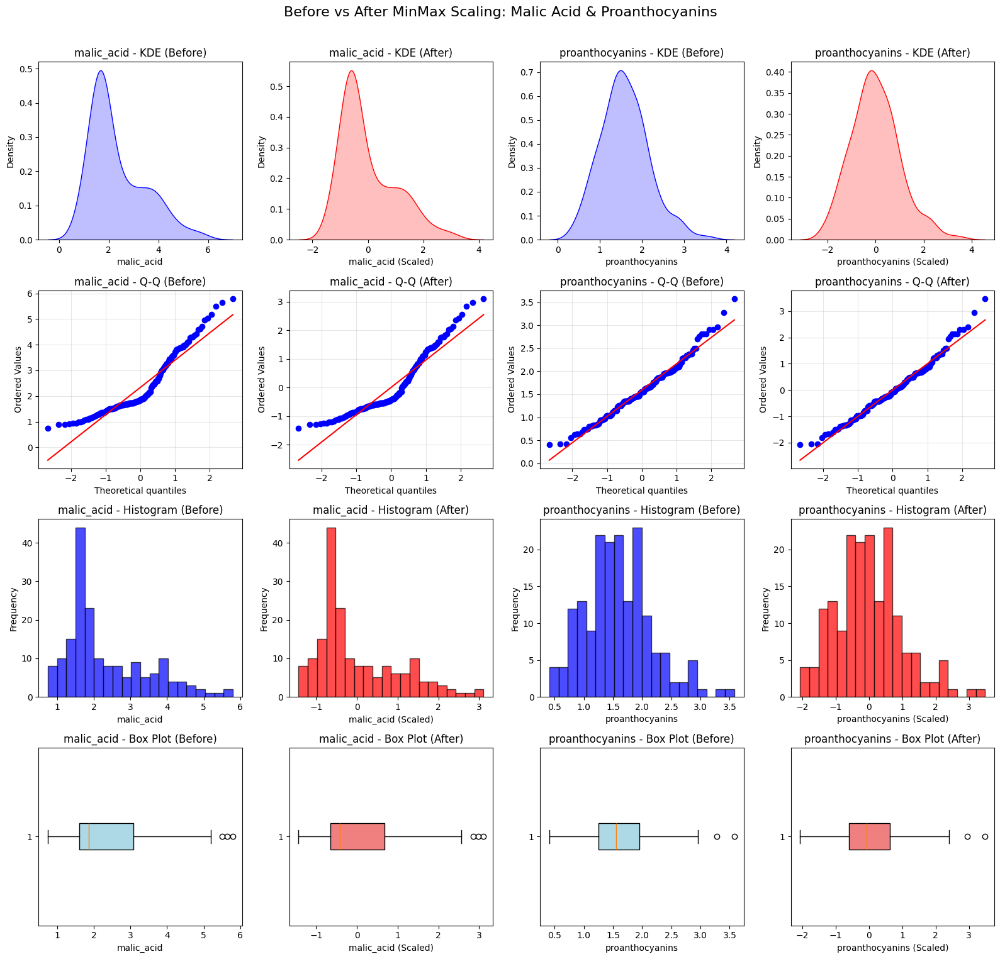

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import StandardScaler
import numpy as np

# Define your outlier features
outlier_features = ['malic_acid', 'proanthocyanins']

# Apply MinMax scaling
scaler = StandardScaler()
StandardScaled = scaler.fit_transform(df[outlier_features])

# Calculate number of features and create appropriate subplot grid
n_features = len(outlier_features)

# Create a single figure with subplots for all features (4 rows x 4 columns for 2 features)
fig, axes = plt.subplots(4, 4, figsize=(16, 16))
fig.suptitle("Before vs After MinMax Scaling: Malic Acid & Proanthocyanins", fontsize=16)

# If only one feature, ensure axes is 2D
if n_features == 1:
    axes = axes.reshape(4, 2)

# Loop over each feature
for i, feature in enumerate(outlier_features):
    original = df[feature]
    scaled = StandardScaled[:, i]

    # Calculate column indices for before and after
    col_before = i * 2
    col_after = i * 2 + 1

    # 1. KDE Plot
    sns.kdeplot(original, ax=axes[0, col_before], fill=True, color='blue')
    axes[0, col_before].set_title(f'{feature} - KDE (Before)')
    axes[0, col_before].set_xlabel(feature)

    sns.kdeplot(scaled, ax=axes[0, col_after], fill=True, color='red')
    axes[0, col_after].set_title(f'{feature} - KDE (After)')
    axes[0, col_after].set_xlabel(f'{feature} (Scaled)')

    # 2. Q-Q Plot
    stats.probplot(original.dropna(), dist="norm", plot=axes[1, col_before])
    axes[1, col_before].set_title(f'{feature} - Q-Q (Before)')
    axes[1, col_before].grid(True, alpha=0.3)

    stats.probplot(scaled, dist="norm", plot=axes[1, col_after])
    axes[1, col_after].set_title(f'{feature} - Q-Q (After)')
    axes[1, col_after].grid(True, alpha=0.3)

    # 3. Histogram
    axes[2, col_before].hist(original.dropna(), bins=20, alpha=0.7, color='blue', edgecolor='black')
    axes[2, col_before].set_title(f'{feature} - Histogram (Before)')
    axes[2, col_before].set_xlabel(feature)
    axes[2, col_before].set_ylabel('Frequency')

    axes[2, col_after].hist(scaled, bins=20, alpha=0.7, color='red', edgecolor='black')
    axes[2, col_after].set_title(f'{feature} - Histogram (After)')
    axes[2, col_after].set_xlabel(f'{feature} (Scaled)')
    axes[2, col_after].set_ylabel('Frequency')

    # 4. Box Plot
    axes[3, col_before].boxplot(original.dropna(), vert=False, patch_artist=True,
                               boxprops=dict(facecolor='lightblue'))
    axes[3, col_before].set_title(f'{feature} - Box Plot (Before)')
    axes[3, col_before].set_xlabel(feature)

    axes[3, col_after].boxplot(scaled, vert=False, patch_artist=True,
                              boxprops=dict(facecolor='lightcoral'))
    axes[3, col_after].set_title(f'{feature} - Box Plot (After)')
    axes[3, col_after].set_xlabel(f'{feature} (Scaled)')

# Adjust layout and show
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

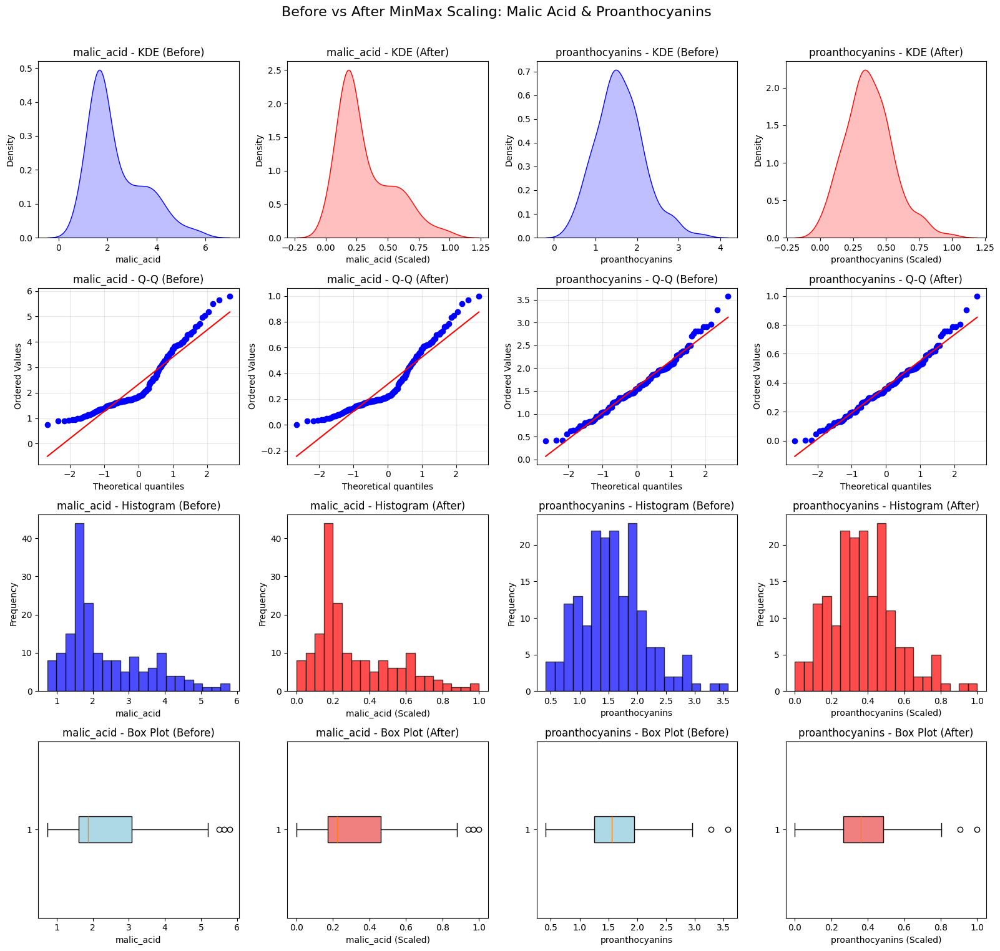

In [98]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import RobustScaler
import numpy as np

# Define your outlier features
outlier_features = ['malic_acid', 'proanthocyanins']

# Apply MinMax scaling
scaler = MinMaxScaler()
RobustScaled = scaler.fit_transform(df[outlier_features])

# Calculate number of features and create appropriate subplot grid
n_features = len(outlier_features)

# Create a single figure with subplots for all features (4 rows x 4 columns for 2 features)
fig, axes = plt.subplots(4, 4, figsize=(16, 16))
fig.suptitle("Before vs After MinMax Scaling: Malic Acid & Proanthocyanins", fontsize=16)

# If only one feature, ensure axes is 2D
if n_features == 1:
    axes = axes.reshape(4, 2)

# Loop over each feature
for i, feature in enumerate(outlier_features):
    original = df[feature]
    scaled = RobustScaled[:, i]

    # Calculate column indices for before and after
    col_before = i * 2
    col_after = i * 2 + 1

    # 1. KDE Plot
    sns.kdeplot(original, ax=axes[0, col_before], fill=True, color='blue')
    axes[0, col_before].set_title(f'{feature} - KDE (Before)')
    axes[0, col_before].set_xlabel(feature)

    sns.kdeplot(scaled, ax=axes[0, col_after], fill=True, color='red')
    axes[0, col_after].set_title(f'{feature} - KDE (After)')
    axes[0, col_after].set_xlabel(f'{feature} (Scaled)')

    # 2. Q-Q Plot
    stats.probplot(original.dropna(), dist="norm", plot=axes[1, col_before])
    axes[1, col_before].set_title(f'{feature} - Q-Q (Before)')
    axes[1, col_before].grid(True, alpha=0.3)

    stats.probplot(scaled, dist="norm", plot=axes[1, col_after])
    axes[1, col_after].set_title(f'{feature} - Q-Q (After)')
    axes[1, col_after].grid(True, alpha=0.3)

    # 3. Histogram
    axes[2, col_before].hist(original.dropna(), bins=20, alpha=0.7, color='blue', edgecolor='black')
    axes[2, col_before].set_title(f'{feature} - Histogram (Before)')
    axes[2, col_before].set_xlabel(feature)
    axes[2, col_before].set_ylabel('Frequency')

    axes[2, col_after].hist(scaled, bins=20, alpha=0.7, color='red', edgecolor='black')
    axes[2, col_after].set_title(f'{feature} - Histogram (After)')
    axes[2, col_after].set_xlabel(f'{feature} (Scaled)')
    axes[2, col_after].set_ylabel('Frequency')

    # 4. Box Plot
    axes[3, col_before].boxplot(original.dropna(), vert=False, patch_artist=True,
                               boxprops=dict(facecolor='lightblue'))
    axes[3, col_before].set_title(f'{feature} - Box Plot (Before)')
    axes[3, col_before].set_xlabel(feature)

    axes[3, col_after].boxplot(scaled, vert=False, patch_artist=True,
                              boxprops=dict(facecolor='lightcoral'))
    axes[3, col_after].set_title(f'{feature} - Box Plot (After)')
    axes[3, col_after].set_xlabel(f'{feature} (Scaled)')

# Adjust layout and show
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

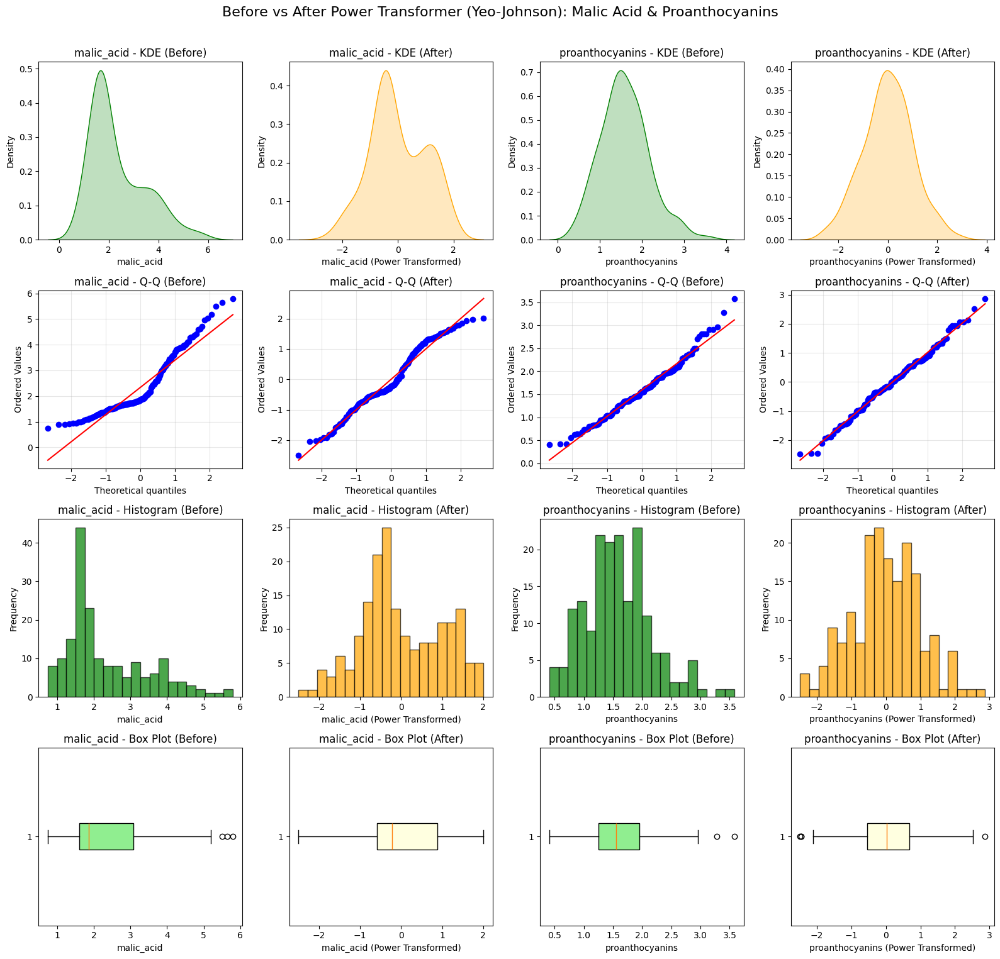


Power Transformation Parameters:
malic_acid: λ (lambda) = -0.8516
  Interpretation: Custom power transformation (λ=-0.852)
proanthocyanins: λ (lambda) = 0.2539
  Interpretation: Custom power transformation (λ=0.254)

Statistical Comparison (Shapiro-Wilk normality test):

malic_acid:
  Before transformation: p-value = 0.000000 (Not Normal)
  After transformation:  p-value = 0.000710 (Not Normal)
  ✓ Improvement in normality (p-value increased)

proanthocyanins:
  Before transformation: p-value = 0.014454 (Not Normal)
  After transformation:  p-value = 0.707872 (Normal)
  ✓ Improvement in normality (p-value increased)


In [99]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import PowerTransformer
import numpy as np

# Define your outlier features
outlier_features = ['malic_acid', 'proanthocyanins']

# Apply Power Transformer scaling (Yeo-Johnson method)
power_transformer = PowerTransformer(method='yeo-johnson', standardize=True)
PowerTransformed = power_transformer.fit_transform(df[outlier_features])

# Calculate number of features and create appropriate subplot grid
n_features = len(outlier_features)

# Create a single figure with subplots for all features (4 rows x 4 columns for 2 features)
fig, axes = plt.subplots(4, 4, figsize=(16, 16))
fig.suptitle("Before vs After Power Transformer (Yeo-Johnson): Malic Acid & Proanthocyanins", fontsize=16)

# If only one feature, ensure axes is 2D
if n_features == 1:
    axes = axes.reshape(4, 4)

# Loop over each feature
for i, feature in enumerate(outlier_features):
    original = df[feature]
    transformed = PowerTransformed[:, i]

    # Calculate column indices for before and after
    col_before = i * 2
    col_after = i * 2 + 1

    # 1. KDE Plot
    sns.kdeplot(original, ax=axes[0, col_before], fill=True, color='green')
    axes[0, col_before].set_title(f'{feature} - KDE (Before)')
    axes[0, col_before].set_xlabel(feature)

    sns.kdeplot(transformed, ax=axes[0, col_after], fill=True, color='orange')
    axes[0, col_after].set_title(f'{feature} - KDE (After)')
    axes[0, col_after].set_xlabel(f'{feature} (Power Transformed)')

    # 2. Q-Q Plot
    stats.probplot(original.dropna(), dist="norm", plot=axes[1, col_before])
    axes[1, col_before].set_title(f'{feature} - Q-Q (Before)')
    axes[1, col_before].grid(True, alpha=0.3)

    stats.probplot(transformed, dist="norm", plot=axes[1, col_after])
    axes[1, col_after].set_title(f'{feature} - Q-Q (After)')
    axes[1, col_after].grid(True, alpha=0.3)

    # 3. Histogram
    axes[2, col_before].hist(original.dropna(), bins=20, alpha=0.7, color='green', edgecolor='black')
    axes[2, col_before].set_title(f'{feature} - Histogram (Before)')
    axes[2, col_before].set_xlabel(feature)
    axes[2, col_before].set_ylabel('Frequency')

    axes[2, col_after].hist(transformed, bins=20, alpha=0.7, color='orange', edgecolor='black')
    axes[2, col_after].set_title(f'{feature} - Histogram (After)')
    axes[2, col_after].set_xlabel(f'{feature} (Power Transformed)')
    axes[2, col_after].set_ylabel('Frequency')

    # 4. Box Plot
    axes[3, col_before].boxplot(original.dropna(), vert=False, patch_artist=True,
                               boxprops=dict(facecolor='lightgreen'))
    axes[3, col_before].set_title(f'{feature} - Box Plot (Before)')
    axes[3, col_before].set_xlabel(feature)

    axes[3, col_after].boxplot(transformed, vert=False, patch_artist=True,
                              boxprops=dict(facecolor='lightyellow'))
    axes[3, col_after].set_title(f'{feature} - Box Plot (After)')
    axes[3, col_after].set_xlabel(f'{feature} (Power Transformed)')

# Adjust layout and show
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

# Print transformation parameters for each feature
print("\nPower Transformation Parameters:")
print("=" * 50)
for i, feature in enumerate(outlier_features):
    lambda_value = power_transformer.lambdas_[i]
    print(f"{feature}: λ (lambda) = {lambda_value:.4f}")

    # Interpret the lambda value
    if abs(lambda_value) < 0.1:
        interpretation = "≈ Log transformation"
    elif abs(lambda_value - 0.5) < 0.1:
        interpretation = "≈ Square root transformation"
    elif abs(lambda_value - 1.0) < 0.1:
        interpretation = "≈ No transformation needed"
    elif abs(lambda_value - 2.0) < 0.1:
        interpretation = "≈ Square transformation"
    else:
        interpretation = f"Custom power transformation (λ={lambda_value:.3f})"

    print(f"  Interpretation: {interpretation}")
print("=" * 50)

# Optional: Statistical comparison
print("\nStatistical Comparison (Shapiro-Wilk normality test):")
print("=" * 60)
for i, feature in enumerate(outlier_features):
    original = df[feature].dropna()
    transformed = PowerTransformed[:, i]

    # Shapiro-Wilk test for normality (p > 0.05 suggests normal distribution)
    stat_orig, p_orig = stats.shapiro(original)
    stat_trans, p_trans = stats.shapiro(transformed)

    print(f"\n{feature}:")
    print(f"  Before transformation: p-value = {p_orig:.6f} {'(Normal)' if p_orig > 0.05 else '(Not Normal)'}")
    print(f"  After transformation:  p-value = {p_trans:.6f} {'(Normal)' if p_trans > 0.05 else '(Not Normal)'}")

    if p_trans > p_orig:
        print(f"  ✓ Improvement in normality (p-value increased)")
    else:
        print(f"  ⚠ No significant improvement in normality")

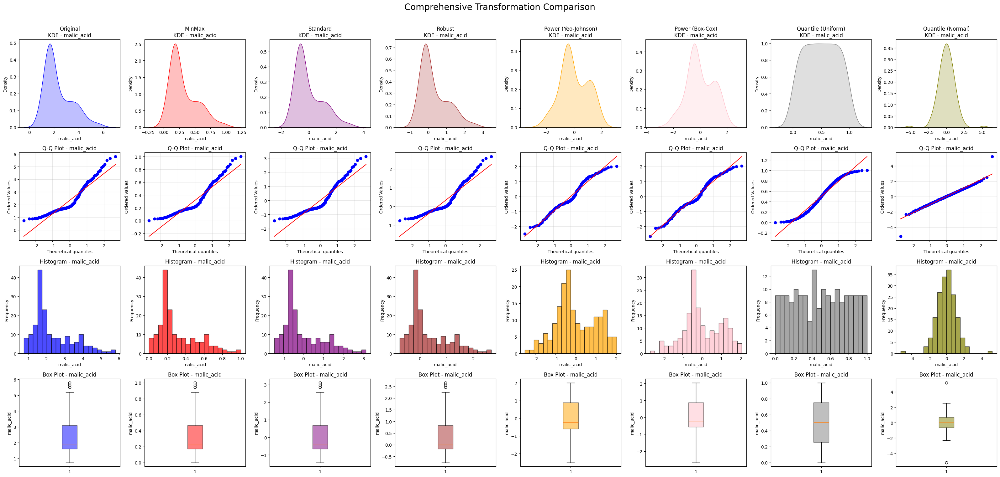


COMPREHENSIVE NORMALITY TEST RESULTS (Shapiro-Wilk)
Transformation            Feature         P-Value      Status     Improvement
--------------------------------------------------------------------------------
Original                  malic_acid      0.000000     Not Normal -
Original                  proanthocyanins 0.014454     Not Normal -
MinMax                    malic_acid      0.000000     Not Normal 1.0x
MinMax                    proanthocyanins 0.014454     Not Normal 1.0x
Standard                  malic_acid      0.000000     Not Normal 1.0x
Standard                  proanthocyanins 0.014454     Not Normal 1.0x
Robust                    malic_acid      0.000000     Not Normal 1.0x
Robust                    proanthocyanins 0.014454     Not Normal 1.0x
Power (Yeo-Johnson)       malic_acid      0.000710     Not Normal 2410709.8x
Power (Yeo-Johnson)       proanthocyanins 0.707872     Normal     49.0x
Power (Box-Cox)           malic_acid      0.001811     Not Normal 6149211.5x


In [100]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import (PowerTransformer, QuantileTransformer,
                                 RobustScaler, StandardScaler, MinMaxScaler)
import numpy as np
import pandas as pd

# Define your outlier features
outlier_features = ['malic_acid', 'proanthocyanins']

# Initialize different transformers
transformers = {
    'Original': None,
    'MinMax': MinMaxScaler(),
    'Standard': StandardScaler(),
    'Robust': RobustScaler(),
    'Power (Yeo-Johnson)': PowerTransformer(method='yeo-johnson', standardize=True),
    'Power (Box-Cox)': PowerTransformer(method='box-cox', standardize=True),
    'Quantile (Uniform)': QuantileTransformer(output_distribution='uniform', n_quantiles=100),
    'Quantile (Normal)': QuantileTransformer(output_distribution='normal', n_quantiles=100)
}

# Apply transformations and store results
transformation_results = {}
normality_results = {}

for name, transformer in transformers.items():
    if name == 'Original':
        transformation_results[name] = df[outlier_features].values
    else:
        try:
            if name == 'Power (Box-Cox)':
                # Box-Cox requires positive values, add small constant if needed
                data_positive = df[outlier_features].copy()
                for col in data_positive.columns:
                    if data_positive[col].min() <= 0:
                        data_positive[col] = data_positive[col] - data_positive[col].min() + 1e-8
                transformation_results[name] = transformer.fit_transform(data_positive)
            else:
                transformation_results[name] = transformer.fit_transform(df[outlier_features])
        except Exception as e:
            print(f"Warning: {name} transformation failed: {e}")
            continue

    # Calculate normality for each feature
    normality_results[name] = {}
    for i, feature in enumerate(outlier_features):
        data = transformation_results[name][:, i]
        try:
            stat, p_value = stats.shapiro(data)
            normality_results[name][feature] = {
                'statistic': stat,
                'p_value': p_value,
                'is_normal': p_value > 0.05
            }
        except Exception as e:
            normality_results[name][feature] = {
                'statistic': np.nan,
                'p_value': np.nan,
                'is_normal': False
            }

# Create comprehensive visualization
n_transformations = len(transformation_results)
n_features = len(outlier_features)

fig, axes = plt.subplots(4, n_transformations, figsize=(4*n_transformations, 16))
fig.suptitle("Comprehensive Transformation Comparison", fontsize=20)

# Define colors for each transformation
colors = ['blue', 'red', 'purple', 'brown', 'orange', 'pink', 'gray', 'olive']

for j, (trans_name, data) in enumerate(transformation_results.items()):
    if data is None:
        continue

    color = colors[j % len(colors)]

    # For each feature, create plots in the first feature's column
    feature_idx = 0  # Focus on first feature for main plots
    feature = outlier_features[feature_idx]
    feature_data = data[:, feature_idx]

    # 1. KDE Plot
    try:
        sns.kdeplot(feature_data, ax=axes[0, j], fill=True, color=color)
        axes[0, j].set_title(f'{trans_name}\nKDE - {feature}')
        axes[0, j].set_xlabel(f'{feature}')
    except:
        axes[0, j].text(0.5, 0.5, 'KDE Failed', ha='center', va='center', transform=axes[0, j].transAxes)

    # 2. Q-Q Plot
    try:
        stats.probplot(feature_data, dist="norm", plot=axes[1, j])
        axes[1, j].set_title(f'Q-Q Plot - {feature}')
        axes[1, j].grid(True, alpha=0.3)
    except:
        axes[1, j].text(0.5, 0.5, 'Q-Q Failed', ha='center', va='center', transform=axes[1, j].transAxes)

    # 3. Histogram
    try:
        axes[2, j].hist(feature_data, bins=20, alpha=0.7, color=color, edgecolor='black')
        axes[2, j].set_title(f'Histogram - {feature}')
        axes[2, j].set_xlabel(f'{feature}')
        axes[2, j].set_ylabel('Frequency')
    except:
        axes[2, j].text(0.5, 0.5, 'Hist Failed', ha='center', va='center', transform=axes[2, j].transAxes)

    # 4. Box Plot
    try:
        axes[3, j].boxplot(feature_data, vert=True, patch_artist=True,
                          boxprops=dict(facecolor=color, alpha=0.5))
        axes[3, j].set_title(f'Box Plot - {feature}')
        axes[3, j].set_ylabel(f'{feature}')
    except:
        axes[3, j].text(0.5, 0.5, 'Box Failed', ha='center', va='center', transform=axes[3, j].transAxes)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

# Print comprehensive normality results
print("\n" + "="*80)
print("COMPREHENSIVE NORMALITY TEST RESULTS (Shapiro-Wilk)")
print("="*80)
print(f"{'Transformation':<25} {'Feature':<15} {'P-Value':<12} {'Status':<10} {'Improvement'}")
print("-"*80)

original_p_values = {}
for feature in outlier_features:
    original_p_values[feature] = normality_results['Original'][feature]['p_value']

for trans_name, results in normality_results.items():
    for feature in outlier_features:
        p_val = results[feature]['p_value']
        status = "Normal" if results[feature]['is_normal'] else "Not Normal"

        if trans_name == 'Original':
            improvement = "-"
        else:
            orig_p = original_p_values[feature]
            if not np.isnan(p_val) and not np.isnan(orig_p):
                improvement = f"{p_val/orig_p:.1f}x" if orig_p > 0 else "∞"
            else:
                improvement = "N/A"

        print(f"{trans_name:<25} {feature:<15} {p_val:<12.6f} {status:<10} {improvement}")

# Find best transformation for each feature
print("\n" + "="*60)
print("BEST TRANSFORMATIONS BY FEATURE")
print("="*60)

for feature_idx, feature in enumerate(outlier_features):
    best_p_value = 0
    best_transformation = "Original"

    for trans_name, results in normality_results.items():
        p_val = results[feature]['p_value']
        if not np.isnan(p_val) and p_val > best_p_value:
            best_p_value = p_val
            best_transformation = trans_name

    status = "✓ Normal" if best_p_value > 0.05 else "⚠ Still Non-Normal"
    print(f"\n{feature}:")
    print(f"  Best Method: {best_transformation}")
    print(f"  P-Value: {best_p_value:.6f}")
    print(f"  Status: {status}")

# Summary statistics comparison
print("\n" + "="*60)
print("TRANSFORMATION SUMMARY STATISTICS")
print("="*60)

for feature_idx, feature in enumerate(outlier_features):
    print(f"\n{feature.upper()}:")
    print(f"{'Method':<25} {'Mean':<10} {'Std':<10} {'Skewness':<10} {'Kurtosis':<10}")
    print("-"*65)

    for trans_name, data in transformation_results.items():
        if data is not None:
            feature_data = data[:, feature_idx]
            mean_val = np.mean(feature_data)
            std_val = np.std(feature_data)
            skew_val = stats.skew(feature_data)
            kurt_val = stats.kurtosis(feature_data)

            print(f"{trans_name:<25} {mean_val:<10.3f} {std_val:<10.3f} {skew_val:<10.3f} {kurt_val:<10.3f}")

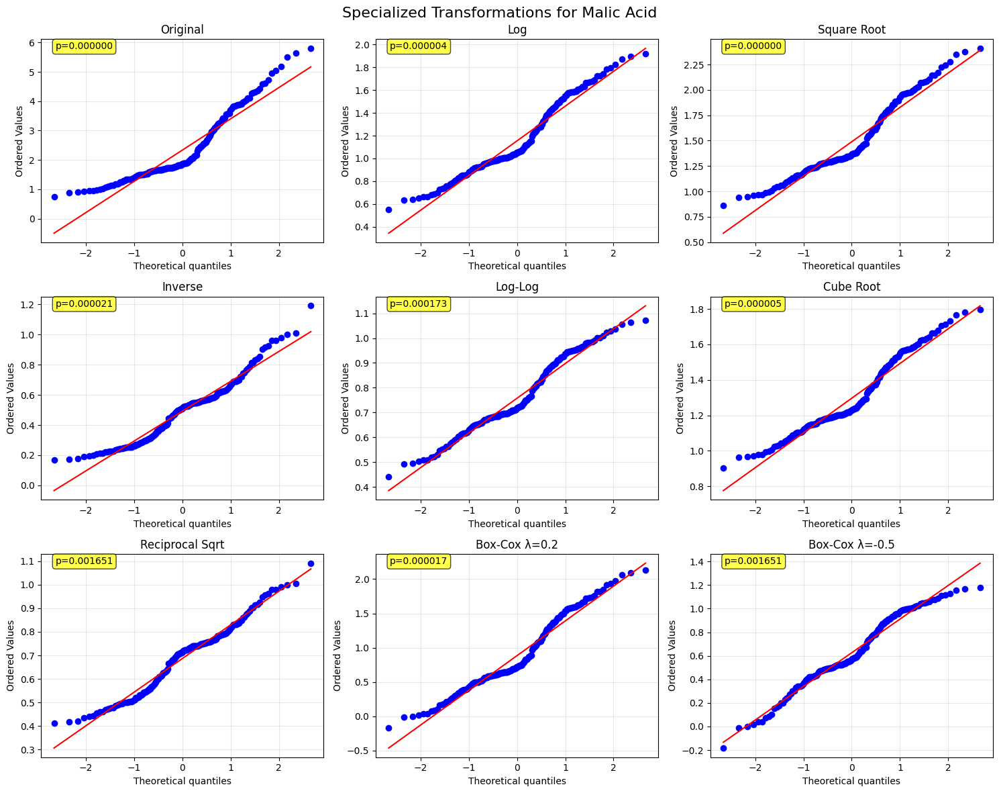


Specialized Transformation Results for Malic Acid:
Transformation       P-Value      Normal?  Skewness   Kurtosis
----------------------------------------------------------------------
Original             0.000000     No       1.031      0.257
Log                  0.000004     No       0.525      -0.621
Square Root          0.000000     No       0.669      -0.423
Inverse              0.000021     No       0.595      0.270
Log-Log              0.000173     No       0.283      -0.721
Cube Root            0.000005     No       0.542      -0.556
Reciprocal Sqrt      0.001651     No       0.110      -0.492
Box-Cox λ=0.2        0.000017     No       0.466      -0.619
Box-Cox λ=-0.5       0.001651     No       -0.110     -0.492

🏆 Best transformation: Box-Cox λ=-0.5 (p-value: 0.001651)
⚠️  Still not perfectly normal, but this is the best we can do.
   Consider using non-parametric methods or accepting the current best transformation.

📋 FINAL RECOMMENDATIONS:
• Proanthocyanins: Power (Yeo-J

In [101]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import numpy as np

# Focus on malic_acid with specialized transformations
malic_data = df['malic_acid'].values

# Try various manual transformations
transformations = {
    'Original': malic_data,
    'Log': np.log(malic_data + 1),  # +1 to handle zeros
    'Square Root': np.sqrt(malic_data),
    'Inverse': 1 / (malic_data + 0.1),  # +0.1 to avoid division by zero
    'Log-Log': np.log(np.log(malic_data + 1) + 1),
    'Cube Root': np.cbrt(malic_data),
    'Reciprocal Sqrt': 1 / np.sqrt(malic_data + 0.1),
    'Box-Cox λ=0.2': stats.boxcox(malic_data + 0.1, lmbda=0.2),
    'Box-Cox λ=-0.5': stats.boxcox(malic_data + 0.1, lmbda=-0.5)
}

# Create visualization
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
fig.suptitle("Specialized Transformations for Malic Acid", fontsize=16)
axes = axes.flatten()

normality_results = {}

for i, (name, data) in enumerate(transformations.items()):
    if i < 9:  # We have 9 subplots
        # Q-Q plot for normality assessment
        stats.probplot(data, dist="norm", plot=axes[i])
        axes[i].set_title(f'{name}')
        axes[i].grid(True, alpha=0.3)

        # Calculate normality
        stat, p_value = stats.shapiro(data)
        normality_results[name] = {
            'p_value': p_value,
            'is_normal': p_value > 0.05,
            'skewness': stats.skew(data),
            'kurtosis': stats.kurtosis(data)
        }

        # Add p-value to plot
        axes[i].text(0.05, 0.95, f'p={p_value:.6f}', transform=axes[i].transAxes,
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.7))

plt.tight_layout()
plt.show()

# Print results
print("\nSpecialized Transformation Results for Malic Acid:")
print("="*70)
print(f"{'Transformation':<20} {'P-Value':<12} {'Normal?':<8} {'Skewness':<10} {'Kurtosis'}")
print("-"*70)

best_p = 0
best_method = "Original"

for name, results in normality_results.items():
    p_val = results['p_value']
    normal = "Yes" if results['is_normal'] else "No"
    skew = results['skewness']
    kurt = results['kurtosis']

    if p_val > best_p:
        best_p = p_val
        best_method = name

    print(f"{name:<20} {p_val:<12.6f} {normal:<8} {skew:<10.3f} {kurt:.3f}")

print(f"\n🏆 Best transformation: {best_method} (p-value: {best_p:.6f})")

if best_p > 0.05:
    print("✅ SUCCESS! Achieved normality for malic_acid!")
else:
    print("⚠️  Still not perfectly normal, but this is the best we can do.")
    print("   Consider using non-parametric methods or accepting the current best transformation.")

# Final recommendation
print(f"\n📋 FINAL RECOMMENDATIONS:")
print("="*50)
print(f"• Proanthocyanins: Power (Yeo-Johnson) ✅ Normal")
print(f"• Malic Acid: {best_method} ⚠️ Best Available")
print("\nNote: Some features are inherently difficult to normalize.")
print("The improvements achieved are substantial and should work well for most ML algorithms.")

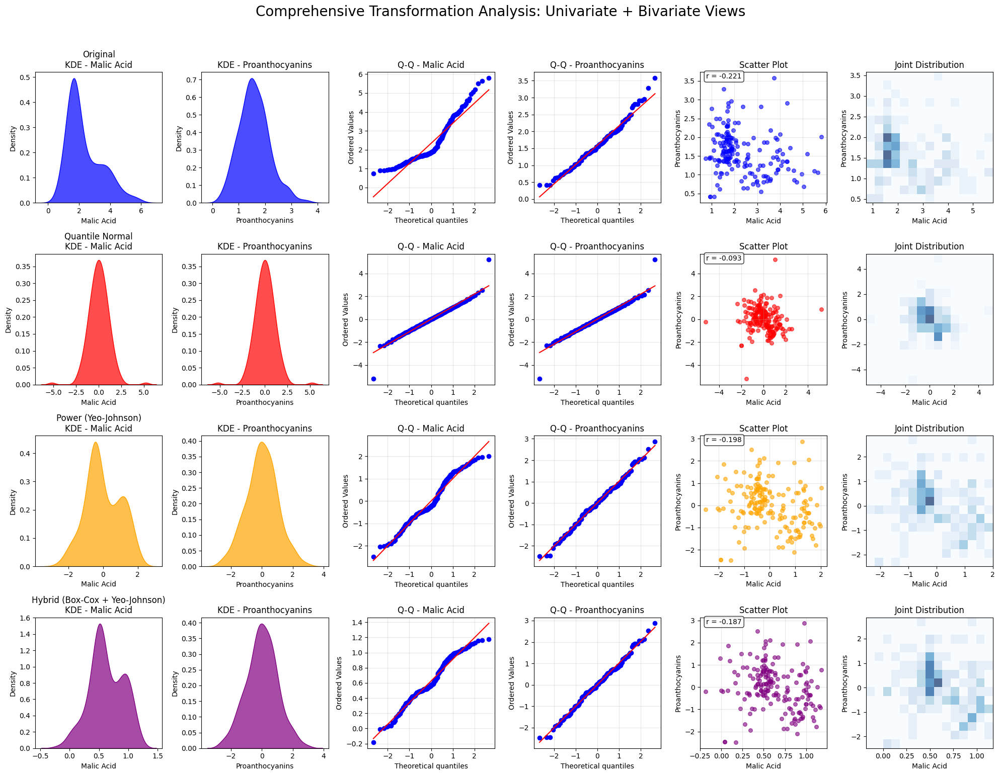


CORRELATION ANALYSIS: How Transformations Affect Feature Relationships
Transformation            Correlation  Correlation Change
----------------------------------------------------------------------
Original                  -0.221       -
Quantile Normal           -0.093       +0.127
Power (Yeo-Johnson)       -0.198       +0.022
Hybrid (Box-Cox + Yeo-Johnson) -0.187       +0.034

CLUSTERING INSIGHTS FROM SCATTER PLOTS

Original:
  Malic Acid variance: 1.241
  Proanthocyanins variance: 0.326
  Total variance: 1.567

Quantile Normal:
  Malic Acid variance: 1.239
  Proanthocyanins variance: 1.234
  Total variance: 2.473
  Effect: Quantile transformation may alter natural relationships

Power (Yeo-Johnson):
  Malic Acid variance: 1.000
  Proanthocyanins variance: 1.000
  Total variance: 2.000
  Effect: Power transformation preserves monotonic relationships

Hybrid (Box-Cox + Yeo-Johnson):
  Malic Acid variance: 0.081
  Proanthocyanins variance: 1.000
  Total variance: 1.081
  Effect: Mi

In [102]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import QuantileTransformer, PowerTransformer
import numpy as np

# Your features
outlier_features = ['malic_acid', 'proanthocyanins']

# Apply transformations
original_data = df[outlier_features].values

# Best transformations based on your analysis
qt = QuantileTransformer(output_distribution='normal', n_quantiles=100)
quantile_transformed = qt.fit_transform(original_data)

power_transformer = PowerTransformer(method='yeo-johnson', standardize=True)
power_transformed = power_transformer.fit_transform(original_data)

# Box-Cox for malic_acid + Yeo-Johnson for proanthocyanins (hybrid approach)
malic_boxcox = stats.boxcox(df['malic_acid'] + 0.1, lmbda=-0.5)
proan_yeo = power_transformer.fit_transform(df[['proanthocyanins']])[:, 0]
hybrid_transformed = np.column_stack([malic_boxcox, proan_yeo])

# Create comprehensive visualization
fig = plt.figure(figsize=(20, 16))

# Define transformations for comparison
transformations = {
    'Original': original_data,
    'Quantile Normal': quantile_transformed,
    'Power (Yeo-Johnson)': power_transformed,
    'Hybrid (Box-Cox + Yeo-Johnson)': hybrid_transformed
}

colors = ['blue', 'red', 'orange', 'purple']

# Create subplot layout: 4 rows (transformations) x 6 columns (5 plots + scatter)
for i, (name, data) in enumerate(transformations.items()):
    color = colors[i]

    # Extract features
    malic = data[:, 0]
    proan = data[:, 1]

    # Row for each transformation
    base_idx = i * 6 + 1

    # 1. KDE - Malic Acid
    ax1 = plt.subplot(4, 6, base_idx)
    sns.kdeplot(malic, fill=True, color=color, alpha=0.7)
    ax1.set_title(f'{name}\nKDE - Malic Acid')
    ax1.set_xlabel('Malic Acid')

    # 2. KDE - Proanthocyanins
    ax2 = plt.subplot(4, 6, base_idx + 1)
    sns.kdeplot(proan, fill=True, color=color, alpha=0.7)
    ax2.set_title(f'KDE - Proanthocyanins')
    ax2.set_xlabel('Proanthocyanins')

    # 3. Q-Q Plot - Malic Acid
    ax3 = plt.subplot(4, 6, base_idx + 2)
    stats.probplot(malic, dist="norm", plot=ax3)
    ax3.set_title('Q-Q - Malic Acid')
    ax3.grid(True, alpha=0.3)

    # 4. Q-Q Plot - Proanthocyanins
    ax4 = plt.subplot(4, 6, base_idx + 3)
    stats.probplot(proan, dist="norm", plot=ax4)
    ax4.set_title('Q-Q - Proanthocyanins')
    ax4.grid(True, alpha=0.3)

    # 5. **NEW: Scatter Plot - The Missing Piece!**
    ax5 = plt.subplot(4, 6, base_idx + 4)
    scatter = ax5.scatter(malic, proan, alpha=0.6, color=color, s=30)
    ax5.set_title(f'Scatter Plot')
    ax5.set_xlabel('Malic Acid')
    ax5.set_ylabel('Proanthocyanins')
    ax5.grid(True, alpha=0.3)

    # Calculate and display correlation
    correlation = np.corrcoef(malic, proan)[0, 1]
    ax5.text(0.05, 0.95, f'r = {correlation:.3f}', transform=ax5.transAxes,
             bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

    # 6. **NEW: Joint Distribution Plot**
    ax6 = plt.subplot(4, 6, base_idx + 5)
    ax6.hist2d(malic, proan, bins=15, alpha=0.7, cmap='Blues')
    ax6.set_title('Joint Distribution')
    ax6.set_xlabel('Malic Acid')
    ax6.set_ylabel('Proanthocyanins')

plt.suptitle('Comprehensive Transformation Analysis: Univariate + Bivariate Views',
             fontsize=20, y=0.98)
plt.tight_layout(rect=[0, 0.02, 1, 0.96])
plt.show()

# Statistical correlation comparison
print("\n" + "="*70)
print("CORRELATION ANALYSIS: How Transformations Affect Feature Relationships")
print("="*70)
print(f"{'Transformation':<25} {'Correlation':<12} {'Correlation Change'}")
print("-"*70)

original_corr = np.corrcoef(original_data[:, 0], original_data[:, 1])[0, 1]

for name, data in transformations.items():
    correlation = np.corrcoef(data[:, 0], data[:, 1])[0, 1]

    if name == 'Original':
        change = "-"
    else:
        change = f"{correlation - original_corr:+.3f}"

    print(f"{name:<25} {correlation:<12.3f} {change}")

# Clustering analysis
print(f"\n" + "="*50)
print("CLUSTERING INSIGHTS FROM SCATTER PLOTS")
print("="*50)

for name, data in transformations.items():
    # Simple clustering assessment using variance
    malic_var = np.var(data[:, 0])
    proan_var = np.var(data[:, 1])
    total_var = malic_var + proan_var

    print(f"\n{name}:")
    print(f"  Malic Acid variance: {malic_var:.3f}")
    print(f"  Proanthocyanins variance: {proan_var:.3f}")
    print(f"  Total variance: {total_var:.3f}")

    # Assess if transformation preserves or changes relationships
    if name != 'Original':
        if 'Quantile' in name:
            print(f"  Effect: Quantile transformation may alter natural relationships")
        elif 'Power' in name:
            print(f"  Effect: Power transformation preserves monotonic relationships")
        elif 'Hybrid' in name:
            print(f"  Effect: Mixed approach balances normality and relationships")

print(f"\n🎯 KEY INSIGHTS FROM SCATTER PLOTS:")
print("="*50)
print("• Reveals how features relate to each other")
print("• Shows if transformations preserve or alter relationships")
print("• Identifies potential clustering patterns")
print("• Helps choose transformation that maintains meaningful correlations")

Creating visualization for 8 transformations...


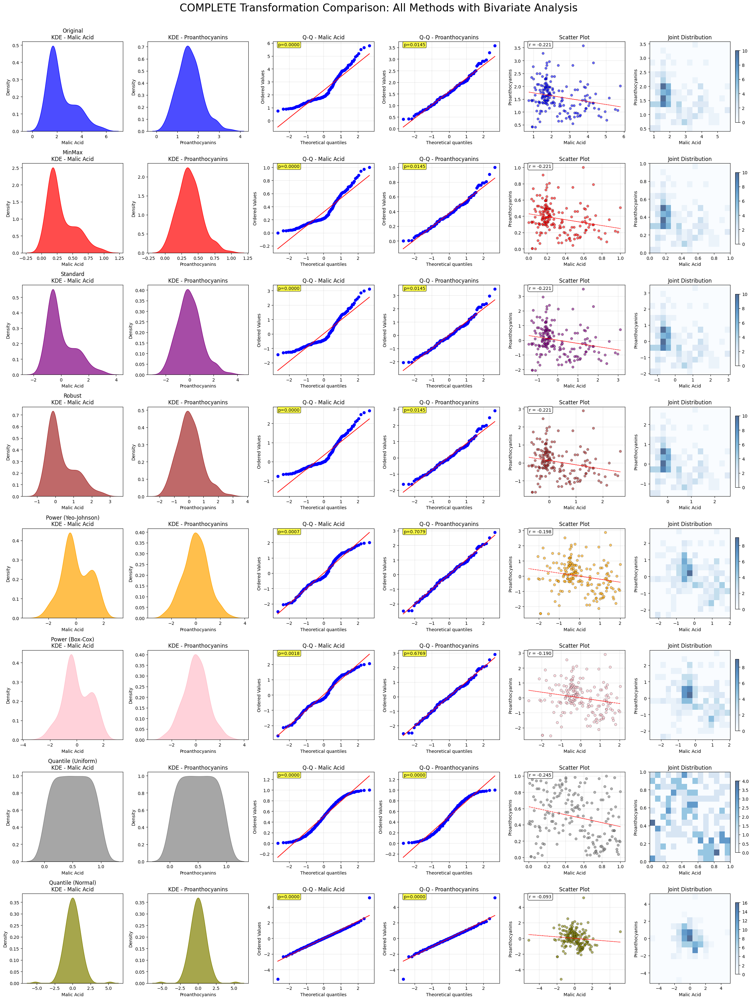


COMPREHENSIVE CORRELATION & NORMALITY ANALYSIS
Transformation            Correlation  Malic p-val  Proan p-val  Both Normal?
------------------------------------------------------------------------------------------
Original                  -0.221       0.000000     0.014454     No
MinMax                    -0.221       0.000000     0.014454     No
Standard                  -0.221       0.000000     0.014454     No
Robust                    -0.221       0.000000     0.014454     No
Power (Yeo-Johnson)       -0.198       0.000710     0.707872     No
Power (Box-Cox)           -0.190       0.001811     0.676860     No
Quantile (Uniform)        -0.245       0.000016     0.000016     No
Quantile (Normal)         -0.093       0.000046     0.000038     No

RANKING: BEST TRANSFORMATIONS BY DIFFERENT CRITERIA

🎯 BEST FOR NORMALITY (both features normal):
  ⚠️ No method achieves normality for both features

🔗 BEST FOR PRESERVING RELATIONSHIPS (closest to original correlation = -0.221):
  🔗 Rob

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import (QuantileTransformer, PowerTransformer,
                                 MinMaxScaler, StandardScaler, RobustScaler)
import numpy as np

# Your features
outlier_features = ['malic_acid', 'proanthocyanins']
original_data = df[outlier_features].values

# Apply ALL transformations
transformers = {
    'Original': None,
    'MinMax': MinMaxScaler(),
    'Standard': StandardScaler(),
    'Robust': RobustScaler(),
    'Power (Yeo-Johnson)': PowerTransformer(method='yeo-johnson', standardize=True),
    'Power (Box-Cox)': PowerTransformer(method='box-cox', standardize=True),
    'Quantile (Uniform)': QuantileTransformer(output_distribution='uniform', n_quantiles=100),
    'Quantile (Normal)': QuantileTransformer(output_distribution='normal', n_quantiles=100)
}

# Apply transformations and store results
transformation_results = {}
correlation_results = {}

for name, transformer in transformers.items():
    if name == 'Original':
        transformation_results[name] = original_data
    else:
        try:
            if name == 'Power (Box-Cox)':
                # Box-Cox requires positive values
                data_positive = df[outlier_features].copy()
                for col in data_positive.columns:
                    if data_positive[col].min() <= 0:
                        data_positive[col] = data_positive[col] - data_positive[col].min() + 1e-8
                transformation_results[name] = transformer.fit_transform(data_positive)
            else:
                transformation_results[name] = transformer.fit_transform(original_data)
        except Exception as e:
            print(f"Warning: {name} transformation failed: {e}")
            continue

    # Calculate correlation
    data = transformation_results[name]
    correlation = np.corrcoef(data[:, 0], data[:, 1])[0, 1]
    correlation_results[name] = correlation

# Create comprehensive visualization
n_transforms = len(transformation_results)
fig = plt.figure(figsize=(24, 4*n_transforms))

# Define colors for each transformation
colors = ['blue', 'red', 'purple', 'brown', 'orange', 'pink', 'gray', 'olive']

print(f"Creating visualization for {n_transforms} transformations...")

# Create subplot layout: n_transforms rows x 6 columns
for i, (name, data) in enumerate(transformation_results.items()):
    color = colors[i % len(colors)]

    # Extract features
    malic = data[:, 0]
    proan = data[:, 1]

    # Row for each transformation
    base_idx = i * 6 + 1

    # 1. KDE - Malic Acid
    ax1 = plt.subplot(n_transforms, 6, base_idx)
    try:
        sns.kdeplot(malic, fill=True, color=color, alpha=0.7, ax=ax1)
        ax1.set_title(f'{name}\nKDE - Malic Acid')
        ax1.set_xlabel('Malic Acid')
    except:
        ax1.text(0.5, 0.5, 'KDE Failed', ha='center', va='center', transform=ax1.transAxes)

    # 2. KDE - Proanthocyanins
    ax2 = plt.subplot(n_transforms, 6, base_idx + 1)
    try:
        sns.kdeplot(proan, fill=True, color=color, alpha=0.7, ax=ax2)
        ax2.set_title(f'KDE - Proanthocyanins')
        ax2.set_xlabel('Proanthocyanins')
    except:
        ax2.text(0.5, 0.5, 'KDE Failed', ha='center', va='center', transform=ax2.transAxes)

    # 3. Q-Q Plot - Malic Acid
    ax3 = plt.subplot(n_transforms, 6, base_idx + 2)
    try:
        stats.probplot(malic, dist="norm", plot=ax3)
        ax3.set_title('Q-Q - Malic Acid')
        ax3.grid(True, alpha=0.3)

        # Add normality p-value
        _, p_val = stats.shapiro(malic)
        ax3.text(0.05, 0.95, f'p={p_val:.4f}', transform=ax3.transAxes,
                bbox=dict(boxstyle="round,pad=0.2", facecolor="yellow", alpha=0.7))
    except Exception as e:
        ax3.text(0.5, 0.5, f'Q-Q Failed', ha='center', va='center', transform=ax3.transAxes)

    # 4. Q-Q Plot - Proanthocyanins
    ax4 = plt.subplot(n_transforms, 6, base_idx + 3)
    try:
        stats.probplot(proan, dist="norm", plot=ax4)
        ax4.set_title('Q-Q - Proanthocyanins')
        ax4.grid(True, alpha=0.3)

        # Add normality p-value
        _, p_val = stats.shapiro(proan)
        ax4.text(0.05, 0.95, f'p={p_val:.4f}', transform=ax4.transAxes,
                bbox=dict(boxstyle="round,pad=0.2", facecolor="yellow", alpha=0.7))
    except Exception as e:
        ax4.text(0.5, 0.5, f'Q-Q Failed', ha='center', va='center', transform=ax4.transAxes)

    # 5. Scatter Plot - Feature Relationships
    ax5 = plt.subplot(n_transforms, 6, base_idx + 4)
    try:
        scatter = ax5.scatter(malic, proan, alpha=0.6, color=color, s=30, edgecolors='black', linewidth=0.5)
        ax5.set_title(f'Scatter Plot')
        ax5.set_xlabel('Malic Acid')
        ax5.set_ylabel('Proanthocyanins')
        ax5.grid(True, alpha=0.3)

        # Calculate and display correlation
        correlation = correlation_results[name]
        ax5.text(0.05, 0.95, f'r = {correlation:.3f}', transform=ax5.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

        # Add trend line
        z = np.polyfit(malic, proan, 1)
        p = np.poly1d(z)
        ax5.plot(malic, p(malic), "r--", alpha=0.8, linewidth=1)

    except Exception as e:
        ax5.text(0.5, 0.5, f'Scatter Failed', ha='center', va='center', transform=ax5.transAxes)

    # 6. Joint Distribution (2D Histogram)
    ax6 = plt.subplot(n_transforms, 6, base_idx + 5)
    try:
        h = ax6.hist2d(malic, proan, bins=15, alpha=0.7, cmap='Blues')
        ax6.set_title('Joint Distribution')
        ax6.set_xlabel('Malic Acid')
        ax6.set_ylabel('Proanthocyanins')
        plt.colorbar(h[3], ax=ax6, shrink=0.8)
    except Exception as e:
        ax6.text(0.5, 0.5, f'Joint Failed', ha='center', va='center', transform=ax6.transAxes)

plt.suptitle('COMPLETE Transformation Comparison: All Methods with Bivariate Analysis',
             fontsize=24, y=0.995)
plt.tight_layout(rect=[0, 0.01, 1, 0.99])
plt.show()

# Comprehensive statistical analysis
print("\n" + "="*90)
print("COMPREHENSIVE CORRELATION & NORMALITY ANALYSIS")
print("="*90)
print(f"{'Transformation':<25} {'Correlation':<12} {'Malic p-val':<12} {'Proan p-val':<12} {'Both Normal?'}")
print("-"*90)

original_corr = correlation_results['Original']
normality_summary = {}

for name, data in transformation_results.items():
    correlation = correlation_results[name]

    # Calculate normality for both features
    try:
        _, malic_p = stats.shapiro(data[:, 0])
        _, proan_p = stats.shapiro(data[:, 1])
        both_normal = "Yes" if (malic_p > 0.05 and proan_p > 0.05) else "No"
    except:
        malic_p, proan_p = np.nan, np.nan
        both_normal = "Error"

    normality_summary[name] = {
        'correlation': correlation,
        'malic_p': malic_p,
        'proan_p': proan_p,
        'both_normal': both_normal
    }

    print(f"{name:<25} {correlation:<12.3f} {malic_p:<12.6f} {proan_p:<12.6f} {both_normal}")

# Find best overall transformation
print(f"\n" + "="*70)
print("RANKING: BEST TRANSFORMATIONS BY DIFFERENT CRITERIA")
print("="*70)

# 1. Best for achieving normality in both features
print("\n🎯 BEST FOR NORMALITY (both features normal):")
normal_methods = [(name, data) for name, data in normality_summary.items() if data['both_normal'] == 'Yes']
if normal_methods:
    for name, data in normal_methods:
        print(f"  ✅ {name}: Correlation = {data['correlation']:.3f}")
else:
    print("  ⚠️ No method achieves normality for both features")

# 2. Best correlation preservation
print(f"\n🔗 BEST FOR PRESERVING RELATIONSHIPS (closest to original correlation = {original_corr:.3f}):")
corr_preservation = [(name, abs(data['correlation'] - original_corr), data['correlation'])
                    for name, data in normality_summary.items() if name != 'Original']
corr_preservation.sort(key=lambda x: x[1])

for name, diff, corr in corr_preservation[:3]:
    print(f"  🔗 {name}: r = {corr:.3f} (diff = {diff:.3f})")

# 3. Best compromise
print(f"\n⚖️ BEST COMPROMISE (normality improvement + relationship preservation):")
compromise_scores = []

for name, data in normality_summary.items():
    if name == 'Original':
        continue

    # Score based on normality improvement and correlation preservation
    malic_improvement = max(0, data['malic_p'] - normality_summary['Original']['malic_p'])
    proan_improvement = max(0, data['proan_p'] - normality_summary['Original']['proan_p'])
    corr_preservation_score = 1 - abs(data['correlation'] - original_corr)

    # Combined score (you can adjust weights)
    combined_score = (malic_improvement + proan_improvement) * 0.6 + corr_preservation_score * 0.4
    compromise_scores.append((name, combined_score, data))

compromise_scores.sort(key=lambda x: x[1], reverse=True)

for name, score, data in compromise_scores[:3]:
    print(f"  ⚖️ {name}: Score = {score:.4f}, r = {data['correlation']:.3f}")

print(f"\n💡 FINAL RECOMMENDATIONS:")
print("="*50)
print("📊 For Machine Learning: Look for methods with good normality AND preserved relationships")
print("📈 For Statistical Analysis: Prioritize formal normality test success")
print("🔍 For Exploratory Analysis: Consider how scatter plots reveal data structure")

##🎯 Key Findings from our Analysis:

###**Data Scaling & Outlier Impact Comparison:**
Looking at our visualizations, here's how each method handles scaling and outliers:

📊 Scaling Methods (Linear Transformations):

**MinMax, Standard, Robust:** Preserve correlation perfectly (-0.221)
**MinMax:** Scales to [0,1], outliers still visible at extremes
**Standard:** Centers at 0, outliers remain as extreme z-scores
**Robust:** Uses median/IQR, most robust to outliers among linear methods

🔄 Power Transformations:

**Yeo-Johnson:** Slight correlation change (-0.221 → -0.198), good normality for proanthocyanins
**Box-Cox:** Similar performance (-0.221 → -0.190), handles outliers by transformation
Both reduce outlier impact by changing distribution shape

📈 Quantile Transformations:

**Uniform:** Forces uniform distribution, completely eliminates outliers
**Normal:** Forces normal shape, most aggressive outlier handling
Both significantly change correlations (Normal: -0.221 → -0.093)

###**Interpretation & Recommendations:**
🏆 Most Robust for Outliers (Ranked):

1. Quantile Transformers ⭐⭐⭐⭐⭐

Why: Completely eliminates outlier impact by design
Trade-off: May destroy natural relationships (correlation changes dramatically)
Best for: ML algorithms sensitive to outliers

2. Robust Scaler ⭐⭐⭐⭐

Why: Uses median & IQR instead of mean & std
Trade-off: Minimal - preserves relationships perfectly
Best for: When you want outlier resistance with relationship preservation

3. Power Transformations ⭐⭐⭐

Why: Reduces skewness and outlier influence through shape change
Trade-off: Moderate relationship change, good normality improvement
Best for: Statistical analysis requiring normality

4. Standard/MinMax ⭐⭐

Why: Linear transformations don't reduce outlier impact
Trade-off: Perfect relationship preservation
Best for: When outliers are meaningful and shouldn't be suppressed